<a href="https://colab.research.google.com/github/claudio1975/Climate_Risk_Modelling_with_LLMs/blob/main/Flood_Exploratory_Data_Analysis_work_v_4_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Prepare Workspace

In [1]:
! pip install feature_engine &>/dev/null

In [2]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
import seaborn as sns
import datetime
import scipy
import scipy.stats as stats
import statsmodels
from pandas.plotting import autocorrelation_plot
import feature_engine
from feature_engine.timeseries.forecasting import WindowFeatures
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from math import radians, sin, cos, sqrt, atan2
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
import sklearn
from sklearn.feature_extraction.text import CountVectorizer
import wordcloud
from wordcloud import WordCloud, STOPWORDS

import warnings
warnings.simplefilter(action='ignore', category=UserWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)

In [3]:
np.__version__

'1.25.2'

In [4]:
pd.__version__

'2.2.2'

In [5]:
matplotlib.__version__

'3.7.1'

In [6]:
sns.__version__

'0.13.1'

In [7]:
scipy.__version__

'1.11.4'

In [8]:
statsmodels.__version__

'0.14.2'

In [9]:
feature_engine.__version__

'1.7.0'

In [10]:
sklearn.__version__

'1.4.2'

In [11]:
wordcloud.__version__

'1.9.3'

### Upload Data set

In [12]:
# dataset collected from US Storm Database
df0=pd.read_csv('flood_dataset.csv',index_col=0)
# dataset collected from US Storm Database with LLMs data augmentation
df=pd.read_csv('flood_dataset_fe4.csv',index_col=0)


### Handling Date Time format

In [13]:
# Trasform BEGIN_DATE_TIME and END_DATE_TIME in datetime format
df["BEGIN_DATE_TIME"] = pd.to_datetime(df["BEGIN_DATE_TIME"], format="%d-%b-%y %H:%M:%S")
df["END_DATE_TIME"] = pd.to_datetime(df["END_DATE_TIME"], format="%d-%b-%y %H:%M:%S")

In [14]:
# Cast datetime variable in datetime format.
df.index = pd.to_datetime(df.BEGIN_DATE_TIME)
df.index.names = ['Date']
# Sanity check: data span.
df.index.min(), df.index.max()

(Timestamp('2006-10-02 14:00:00'), Timestamp('2022-12-31 23:00:00'))

### Have a brief look of the data set

In [15]:
df0.shape

(38398, 31)

In [16]:
df.shape

(38398, 53)

In [17]:
df0.columns

Index(['EVENT_ID', 'BEGIN_DATE_TIME', 'END_DATE_TIME', 'STATE', 'STATE_FIPS',
       'EVENT_TYPE', 'CZ_TYPE', 'CZ_FIPS', 'CZ_NAME', 'WFO', 'CZ_TIMEZONE',
       'INJURIES_DIRECT', 'INJURIES_INDIRECT', 'DEATHS_DIRECT',
       'DEATHS_INDIRECT', 'DAMAGE_PROPERTY', 'DAMAGE_CROPS', 'SOURCE',
       'FLOOD_CAUSE', 'BEGIN_RANGE', 'BEGIN_AZIMUTH', 'BEGIN_LOCATION',
       'END_RANGE', 'END_AZIMUTH', 'END_LOCATION', 'BEGIN_LAT', 'BEGIN_LON',
       'END_LAT', 'END_LON', 'EPISODE_NARRATIVE', 'EVENT_NARRATIVE'],
      dtype='object')

In [18]:
df.columns

Index(['EVENT_ID', 'BEGIN_DATE_TIME', 'END_DATE_TIME', 'STATE', 'STATE_FIPS',
       'EVENT_TYPE', 'CZ_TYPE', 'CZ_FIPS', 'CZ_NAME', 'WFO', 'CZ_TIMEZONE',
       'INJURIES_DIRECT', 'INJURIES_INDIRECT', 'DEATHS_DIRECT',
       'DEATHS_INDIRECT', 'DAMAGE_PROPERTY', 'DAMAGE_CROPS', 'SOURCE',
       'FLOOD_CAUSE', 'BEGIN_RANGE', 'BEGIN_AZIMUTH', 'BEGIN_LOCATION',
       'END_RANGE', 'END_AZIMUTH', 'END_LOCATION', 'BEGIN_LAT', 'BEGIN_LON',
       'END_LAT', 'END_LON', 'EPISODE_NARRATIVE', 'EVENT_NARRATIVE',
       'predicted_sentiment_gpt', 'embed_episod_gpt0', 'embed_episod_gpt1',
       'embed_episod_gpt2', 'embed_episod_gpt3', 'embed_episod_gpt4',
       'embed_episod_gpt5', 'embed_episod_gpt6', 'embed_episod_gpt7',
       'embed_episod_gpt8', 'embed_episod_gpt9', 'embed_event_gpt0',
       'embed_event_gpt1', 'embed_event_gpt2', 'embed_event_gpt3',
       'embed_event_gpt4', 'embed_event_gpt5', 'embed_event_gpt6',
       'embed_event_gpt7', 'embed_event_gpt8', 'embed_event_gpt9',
       

In [19]:
df0.info()

<class 'pandas.core.frame.DataFrame'>
Index: 38398 entries, 0 to 38397
Data columns (total 31 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   EVENT_ID           38398 non-null  int64  
 1   BEGIN_DATE_TIME    38398 non-null  object 
 2   END_DATE_TIME      38398 non-null  object 
 3   STATE              38398 non-null  object 
 4   STATE_FIPS         38398 non-null  float64
 5   EVENT_TYPE         38398 non-null  object 
 6   CZ_TYPE            38398 non-null  object 
 7   CZ_FIPS            38398 non-null  int64  
 8   CZ_NAME            38398 non-null  object 
 9   WFO                38398 non-null  object 
 10  CZ_TIMEZONE        38398 non-null  object 
 11  INJURIES_DIRECT    38398 non-null  int64  
 12  INJURIES_INDIRECT  38398 non-null  int64  
 13  DEATHS_DIRECT      38398 non-null  int64  
 14  DEATHS_INDIRECT    38398 non-null  int64  
 15  DAMAGE_PROPERTY    38398 non-null  float64
 16  DAMAGE_CROPS       38398 no

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 38398 entries, 2006-10-28 14:00:00 to 2022-12-27 06:15:00
Data columns (total 53 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   EVENT_ID                 38398 non-null  int64         
 1   BEGIN_DATE_TIME          38398 non-null  datetime64[ns]
 2   END_DATE_TIME            38398 non-null  datetime64[ns]
 3   STATE                    38398 non-null  object        
 4   STATE_FIPS               38398 non-null  float64       
 5   EVENT_TYPE               38398 non-null  object        
 6   CZ_TYPE                  38398 non-null  object        
 7   CZ_FIPS                  38398 non-null  int64         
 8   CZ_NAME                  38398 non-null  object        
 9   WFO                      38398 non-null  object        
 10  CZ_TIMEZONE              38398 non-null  object        
 11  INJURIES_DIRECT          38398 non-null  int64         
 1

In [21]:
df0.head()

,EVENT_ID,BEGIN_DATE_TIME,END_DATE_TIME,STATE,STATE_FIPS,EVENT_TYPE,CZ_TYPE,CZ_FIPS,CZ_NAME,WFO,...,BEGIN_LOCATION,END_RANGE,END_AZIMUTH,END_LOCATION,BEGIN_LAT,BEGIN_LON,END_LAT,END_LON,EPISODE_NARRATIVE,EVENT_NARRATIVE
0,2161,28-OCT-06 14:00:00,28-OCT-06 16:30:00,MASSACHUSETTS,25.0,Flood,C,25,SUFFOLK,BOX,...,BOSTON,0.0,N,BOSTON,42.32,-71.07,42.32,-71.07,Low pressure intensified rapidly as it tracked...,Significant urban flooding was reported throug...
1,4734,16-NOV-06 20:00:00,16-NOV-06 22:00:00,NEW YORK,36.0,Flood,C,43,HERKIMER,ALY,...,LITTLE FALLS,0.0,N,LITTLE FALLS,43.05,-74.87,43.05,-74.87,A low pressure system developed over the lower...,Flooding caused road closures on Route 5 near ...
2,3709,16-NOV-06 23:49:00,17-NOV-06 05:28:00,NEW YORK,36.0,Flood,C,57,MONTGOMERY,ALY,...,ST JOHNSVILLE,9.0,NW,ST JOHNSVILLE,43.09,-74.54,43.09,-74.54,A low pressure system developed over the lower...,The Mohawk River at Little Falls exceeded its ...
3,3718,17-NOV-06 05:03:00,17-NOV-06 13:56:00,NEW YORK,36.0,Flood,C,57,MONTGOMERY,ALY,...,TRIBES HILL,0.0,N,TRIBES HILL,42.95,-74.30,42.95,-74.30,A low pressure system developed over the lower...,The Mohawk River at Tribes Hill exceeded its f...
4,3720,17-NOV-06 05:03:00,17-NOV-06 13:56:00,NEW YORK,36.0,Flood,C,93,SCHENECTADY,ALY,...,SCHENECTADY,17.0,NW,SCHENECTADY,42.97,-73.68,42.97,-73.68,A low pressure system developed over the lower...,The Mohawk River at Tribes Hill exceeded its f...


In [22]:
df.head()

,EVENT_ID,BEGIN_DATE_TIME,END_DATE_TIME,STATE,STATE_FIPS,EVENT_TYPE,CZ_TYPE,CZ_FIPS,CZ_NAME,WFO,...,embed_event_gpt1,embed_event_gpt2,embed_event_gpt3,embed_event_gpt4,embed_event_gpt5,embed_event_gpt6,embed_event_gpt7,embed_event_gpt8,embed_event_gpt9,predicted_risk_gpt
Date,,,,,,,,,,,,,,,,,,,,,
2006-10-28 14:00:00,2161,2006-10-28 14:00:00,2006-10-28 16:30:00,MASSACHUSETTS,25.0,Flood,C,25,SUFFOLK,BOX,...,-0.009172,-0.000350,-0.001341,-0.020569,-0.002682,-0.017443,0.013211,-0.015320,-0.032622,high risk
2006-11-16 20:00:00,4734,2006-11-16 20:00:00,2006-11-16 22:00:00,NEW YORK,36.0,Flood,C,43,HERKIMER,ALY,...,-0.004088,-0.001276,0.008959,-0.041108,0.024286,-0.024926,-0.009651,-0.005599,-0.019380,high risk
2006-11-16 23:49:00,3709,2006-11-16 23:49:00,2006-11-17 05:28:00,NEW YORK,36.0,Flood,C,57,MONTGOMERY,ALY,...,-0.010422,0.000788,0.008634,-0.009571,0.031676,-0.023744,-0.016657,-0.027255,-0.015474,high risk
2006-11-17 05:03:00,3718,2006-11-17 05:03:00,2006-11-17 13:56:00,NEW YORK,36.0,Flood,C,57,MONTGOMERY,ALY,...,-0.015229,0.002395,0.007543,0.007504,0.027961,-0.023019,-0.020938,-0.020496,-0.022239,high risk
2006-11-17 05:03:00,3720,2006-11-17 05:03:00,2006-11-17 13:56:00,NEW YORK,36.0,Flood,C,93,SCHENECTADY,ALY,...,-0.015229,0.002395,0.007543,0.007504,0.027961,-0.023019,-0.020938,-0.020496,-0.022239,high risk


In [23]:
df0.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
EVENT_ID,38398.0,NaN,NaN,NaN,582042.643888,293802.225946,350.0,320257.25,641838.5,814379.5,1095508.0
BEGIN_DATE_TIME,38398,27478,01-JUN-19 00:00:00,204,NaN,NaN,NaN,NaN,NaN,NaN,NaN
END_DATE_TIME,38398,25667,31-MAY-19 23:59:00,191,NaN,NaN,NaN,NaN,NaN,NaN,NaN
STATE,38398,54,VIRGINIA,2581,NaN,NaN,NaN,NaN,NaN,NaN,NaN
STATE_FIPS,38398.0,NaN,NaN,NaN,30.809313,17.77272,1.0,19.0,29.0,42.0,99.0
EVENT_TYPE,38398,1,Flood,38398,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CZ_TYPE,38398,1,C,38398,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CZ_FIPS,38398.0,NaN,NaN,NaN,88.147924,82.932916,1.0,29.0,71.0,127.0,840.0
CZ_NAME,38398,1754,WASHINGTON,469,NaN,NaN,NaN,NaN,NaN,NaN,NaN
WFO,38398,121,LWX,3289,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [24]:
df.describe(include='all').T

,count,unique,top,freq,mean,min,25%,50%,75%,max,std
EVENT_ID,38398.0,NaN,NaN,NaN,582042.643888,350.0,320257.25,641838.5,814379.5,1095508.0,293802.225946
BEGIN_DATE_TIME,38398,NaN,NaN,NaN,2015-07-29 01:33:52.382415872,2006-10-02 14:00:00,2011-06-01 00:00:00,2016-06-21 04:30:30,2019-03-14 12:00:00,2022-12-31 23:00:00,NaN
END_DATE_TIME,38398,NaN,NaN,NaN,2015-07-31 19:30:29.670295040,2006-10-02 16:00:00,2011-06-07 15:29:45,2016-06-21 07:54:30,2019-03-22 00:00:00,2022-12-31 23:59:00,NaN
STATE,38398,54,VIRGINIA,2581,NaN,NaN,NaN,NaN,NaN,NaN,NaN
STATE_FIPS,38398.0,NaN,NaN,NaN,30.809313,1.0,19.0,29.0,42.0,99.0,17.77272
EVENT_TYPE,38398,1,Flood,38398,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CZ_TYPE,38398,1,C,38398,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CZ_FIPS,38398.0,NaN,NaN,NaN,88.147924,1.0,29.0,71.0,127.0,840.0,82.932916
CZ_NAME,38398,1754,WASHINGTON,469,NaN,NaN,NaN,NaN,NaN,NaN,NaN
WFO,38398,121,LWX,3289,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Build features

In [25]:
# Created year, month, day, time begin/end feature
df_1 = df.copy()
df_1['YEAR_BEGIN'] = pd.DatetimeIndex(df_1['BEGIN_DATE_TIME']).year
df_1['MONTH_BEGIN'] = pd.DatetimeIndex(df_1['BEGIN_DATE_TIME']).month
df_1['DAY_BEGIN'] = pd.DatetimeIndex(df_1['BEGIN_DATE_TIME']).day
df_1['HOUR_BEGIN'] = pd.DatetimeIndex(df_1['BEGIN_DATE_TIME']).hour
df_1['YEAR_BEGIN']= df_1["YEAR_BEGIN"].astype("int64")
df_1['MONTH_BEGIN']= df_1["MONTH_BEGIN"].astype("int64")
df_1['DAY_BEGIN']= df_1["DAY_BEGIN"].astype("int64")
df_1['HOUR_BEGIN']= df_1["HOUR_BEGIN"].astype("int64")
df_1['YEAR_END'] = pd.DatetimeIndex(df_1['END_DATE_TIME']).year
df_1['MONTH_END'] = pd.DatetimeIndex(df_1['END_DATE_TIME']).month
df_1['DAY_END'] = pd.DatetimeIndex(df_1['END_DATE_TIME']).day
df_1['HOUR_END'] = pd.DatetimeIndex(df_1['END_DATE_TIME']).hour
df_1['YEAR_END']= df_1["YEAR_END"].astype("int64")
df_1['MONTH_END']= df_1["MONTH_END"].astype("int64")
df_1['DAY_END']= df_1["DAY_END"].astype("int64")
df_1['HOUR_END']= df_1["HOUR_END"].astype("int64")

In [26]:
# Calculate the difference between dates and convert it to days and hours
df_1['DAY_DURATION'] = (df_1['END_DATE_TIME'] - df_1['BEGIN_DATE_TIME']).dt.days
df_1['HOUR_DURATION'] = (df_1['END_DATE_TIME'] - df_1['BEGIN_DATE_TIME']).dt.total_seconds() / 3600


In [27]:
# Merge Origin and Destination to have a look at the round event
df_1['LOCATION_ORIGIN_DESTINATION'] = df_1['BEGIN_LOCATION']+'-'+df_1['END_LOCATION']
df_1['BEGIN_END_AZIMUTH'] = df_1['BEGIN_AZIMUTH']+'-'+df_1['END_AZIMUTH']


In [28]:
# new target features
df_1['WHOLE_INJURIES'] = df_1['INJURIES_INDIRECT'] + df_1['INJURIES_DIRECT']
df_1['WHOLE_DEATHS'] = df_1['DEATHS_INDIRECT'] + df_1['DEATHS_DIRECT']
df_1['WHOLE_DAMAGE'] = df_1['DAMAGE_CROPS'] + df_1['DAMAGE_PROPERTY']


In [29]:
# Distance of the event
def haversine_distance(row):
    # Convert latitude and longitude from degrees to radians
    lat1, lon1 = radians(row['BEGIN_LAT']), radians(row['BEGIN_LON'])
    lat2, lon2 = radians(row['END_LAT']), radians(row['END_LON'])

    # Haversine formula
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * atan2(sqrt(a), sqrt(1-a))
    radius_of_earth = 6371  # Earth's radius in kilometers
    distance = radius_of_earth * c

    return distance

In [30]:
# Distance
df_1['DISTANCE'] = df_1.apply(haversine_distance, axis=1)
df_1['DISTANCE_RANGE']=df_1['END_RANGE']-df_1['BEGIN_RANGE']

In [31]:
# Drop old variables replaced by new variables
df_2=df_1.copy()
df_2 = df_2.drop(['BEGIN_LOCATION','END_LOCATION','BEGIN_AZIMUTH','END_AZIMUTH',
                  'INJURIES_INDIRECT','DEATHS_INDIRECT','DAMAGE_CROPS',
                  'END_RANGE','BEGIN_RANGE','BEGIN_LAT','BEGIN_LON','END_LAT','END_LON'], axis=1)

### Brief Statistics

In [32]:
num_cols = [cname for cname in df_2.columns if
            df_2[cname].dtype in ['float64','int64']]
num_dist = df_2[num_cols]
num_dist.describe().T

,count,mean,std,min,25%,50%,75%,max
EVENT_ID,38398.0,582042.643888,2.938022e+05,350.000000,320257.250000,641838.500000,814379.500000,1.095508e+06
STATE_FIPS,38398.0,30.809313,1.777272e+01,1.000000,19.000000,29.000000,42.000000,9.900000e+01
CZ_FIPS,38398.0,88.147924,8.293292e+01,1.000000,29.000000,71.000000,127.000000,8.400000e+02
INJURIES_DIRECT,38398.0,0.002787,9.308484e-02,0.000000,0.000000,0.000000,0.000000,1.000000e+01
DEATHS_DIRECT,38398.0,0.010600,1.364297e-01,0.000000,0.000000,0.000000,0.000000,1.000000e+01
DAMAGE_PROPERTY,38398.0,702996.161519,2.111301e+07,0.000000,0.000000,0.000000,1000.000000,2.000000e+09
embed_episod_gpt0,38398.0,-0.016808,9.427289e-03,-0.052020,-0.023349,-0.016708,-0.010367,2.152841e-02
embed_episod_gpt1,38398.0,-0.006413,1.020446e-02,-0.045055,-0.013191,-0.005958,0.000404,3.014877e-02
embed_episod_gpt2,38398.0,0.004548,9.585507e-03,-0.034101,-0.001928,0.004899,0.011089,3.863915e-02
embed_episod_gpt3,38398.0,-0.008144,1.052920e-02,-0.047241,-0.015404,-0.008313,-0.001156,3.534336e-02


In [33]:
class_cols = [cname for cname in df_2.columns if
                    df_2[cname].dtype in ['object']]
class_dist = df_2[class_cols]
class_dist.describe().T

,count,unique,top,freq
STATE,38398,54,VIRGINIA,2581
EVENT_TYPE,38398,1,Flood,38398
CZ_TYPE,38398,1,C,38398
CZ_NAME,38398,1754,WASHINGTON,469
WFO,38398,121,LWX,3289
CZ_TIMEZONE,38398,8,EST-5,16548
SOURCE,38398,33,River/Stream Gage,8333
FLOOD_CAUSE,38398,7,Heavy Rain,32799
EPISODE_NARRATIVE,38398,10895,Heavy rain on saturated soils during the eveni...,110
EVENT_NARRATIVE,38398,36411,See the event episode narrative for details.,46


In [34]:
date_cols = [cname for cname in df_1.columns if
             df_1[cname].dtype in ['datetime64[ns]']]
date_dist = df_1[date_cols]
date_dist.describe().T

,count,mean,min,25%,50%,75%,max
BEGIN_DATE_TIME,38398,2015-07-29 01:33:52.382415872,2006-10-02 14:00:00,2011-06-01 00:00:00,2016-06-21 04:30:30,2019-03-14 12:00:00,2022-12-31 23:00:00
END_DATE_TIME,38398,2015-07-31 19:30:29.670295040,2006-10-02 16:00:00,2011-06-07 15:29:45,2016-06-21 07:54:30,2019-03-22 00:00:00,2022-12-31 23:59:00


### Functions

In [35]:
def statistics(data, var):
    # Univariate analysis looking at Mean, Standard Deviation, Skewness and Kurtosis
    print('Univariate Statistics Analysis')
    print('\nMean :', np.mean(data[var]),
        '\nVariance :', np.var(data[var]),
        '\nStandard Deviation :', np.var(data[var]**0.5),
        '\nSkewness :', stats.skew(data[var]),
        '\nKurtosis :', stats.kurtosis(data[var]))

In [36]:
def groupyear(data, var):
    data_ = data[[var,'YEAR_BEGIN','MONTH_BEGIN']]
    df_year = data_.groupby(['YEAR_BEGIN'], as_index=False)[var].sum()
    df_year_ = pd.DataFrame(df_year).set_index('YEAR_BEGIN')
    return df_year_

In [37]:
def groupmonth(data, var):
    data_ = data[[var,'YEAR_BEGIN','MONTH_BEGIN']]
    df_month = data_.groupby(['MONTH_BEGIN'], as_index=False)[var].sum()
    df_month_ = pd.DataFrame(df_month).set_index('MONTH_BEGIN')
    return df_month_

In [38]:
# target plot
def targetplot(data, var):
    fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(10, 15))

    # Line plot
    groupyear(data, var=var).plot(ax=axes[0, 0])
    axes[0, 0].set_title("{} vs Date Line plot".format(var), fontsize=10)
    axes[0, 0].set_xlabel('YEAR', fontsize=10)
    axes[0, 0].set_ylabel(var, fontsize=10)
    axes[0, 0].tick_params(axis='x', rotation=45, labelsize=10)
    axes[0, 0].tick_params(axis='y', labelsize=10)

    # Histogram
    groupyear(data, var=var).hist(bins=5, ax=axes[0, 1])
    axes[0, 1].set_xlabel('YEAR', fontsize=10)
    axes[0, 1].set_ylabel(var, fontsize=10)
    axes[0, 1].tick_params(axis='x', rotation=45, labelsize=10)
    axes[0, 1].tick_params(axis='y', labelsize=10)

    # Barh plot for year
    data_ordered = groupyear(data, var=var).sort_values(by=var, ascending=False)
    data_ordered.plot(kind='barh', ax=axes[1, 0])
    axes[1, 0].set_title("{} distribution per YEAR".format(var), fontsize=10)
    axes[1, 0].set_xlabel('YEAR', fontsize=10)
    axes[1, 0].set_ylabel(var, fontsize=10)
    axes[1, 0].tick_params(axis='x', rotation=45, labelsize=10)
    axes[1, 0].tick_params(axis='y', labelsize=10)

    # Barh plot for month
    data_ordered = groupmonth(data, var=var).sort_values(by=var, ascending=False)
    data_ordered.plot(kind='barh', ax=axes[1, 1])
    axes[1, 1].set_title("{} distribution per YEAR".format(var), fontsize=10)
    axes[1, 1].set_xlabel('YEAR', fontsize=10)
    axes[1, 1].set_ylabel(var, fontsize=10)
    axes[1, 1].tick_params(axis='x', rotation=45, labelsize=10)
    axes[1, 1].tick_params(axis='y', labelsize=10)


    # KDE plot
    sns.kdeplot(groupyear(data, var=var), ax=axes[2, 0])
    axes[2, 0].set_title("{} Density distribution".format(var), fontsize=10)
    axes[2, 0].set_xlabel('Value', fontsize=10)
    axes[2, 0].set_ylabel("Density", fontsize=10)
    axes[2, 0].tick_params(axis='x', rotation=45, labelsize=10)
    axes[2, 0].tick_params(axis='y', labelsize=10)

    # Autocorrelation plot
    autocorrelation_plot(groupyear(data, var=var), ax=axes[2, 1])
    axes[2, 1].set_title("{} autocorrelation".format(var), fontsize=10)
    axes[2, 1].set_xlabel('Lag', fontsize=10)
    axes[2, 1].set_ylabel('Autocorrelation', fontsize=10)
    axes[2, 1].tick_params(axis='x', rotation=45, labelsize=10)
    axes[2, 1].tick_params(axis='y', labelsize=10)

    # ACF plot
    plot_acf(groupyear(data, var=var), ax=axes[3, 0])
    axes[3, 0].set_xlabel('Lag', fontsize=10)
    axes[3, 0].set_ylabel('Autocorrelation', fontsize=10)
    axes[3, 0].tick_params(axis='x', rotation=45, labelsize=10)
    axes[3, 0].tick_params(axis='y', labelsize=10)

    # PACF plot
    plot_pacf(groupyear(data, var=var), ax=axes[3, 1])
    axes[3, 1].set_xlabel('Lag', fontsize=10)
    axes[3, 1].set_ylabel('Autocorrelation', fontsize=10)
    axes[3, 1].tick_params(axis='x', rotation=45, labelsize=10)
    axes[3, 1].tick_params(axis='y', labelsize=10)

    plt.tight_layout()
    plt.show()


In [39]:
# Decomposition
def decomposition(data, var, model):
    agg_data=data.groupby(pd.Grouper(freq='M')).agg({var: 'sum'})
    # Additive Decomposition
    res = seasonal_decompose(x=agg_data[var], model=model, period=12)
    plt.rcParams['figure.figsize']=(20,20)
    res.plot()
    plt.xlabel('Time', fontsize=20)
    plt.yticks(rotation=0)
    plt.xticks(rotation=45, fontsize=20)
    plt.show()

In [40]:
# Augmented Dickey-Fuller test
def ADF_test(data, var):
    X = data[var].values
    result = adfuller(X)
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))

In [41]:
#  statistics of partitioned time series
def stat_partitioned(df, var):
  X = df[var].values
  split = int(len(X) / 2)
  X1, X2 = X[0:split], X[split:]
  mean1, mean2 = X1.mean(), X2.mean()
  var1, var2 = X1.var(), X2.var()
  print('mean1=%f, mean2=%f' % (mean1, mean2))
  print('variance1=%f, variance2=%f' % (var1, var2))

In [42]:
#  statistics of log partitioned time series
def stat_log_partitioned(df, var):
  X = df[var].values
  X = np.log1p(X)
  split = int(len(X) / 2)
  X1, X2 = X[0:split], X[split:]
  mean1, mean2 = X1.mean(), X2.mean()
  var1, var2 = X1.var(), X2.var()
  print('mean1=%f, mean2=%f' % (mean1, mean2))
  print('variance1=%f, variance2=%f' % (var1, var2))

In [43]:
#  statistics of box-cox partitioned time series
def stat_boxcox_partitioned(df, var, lmbda):
  X = df[var].values
  X = stats.boxcox(X, lmbda)
  split = int(len(X) / 2)
  X1, X2 = X[0:split], X[split:]
  mean1, mean2 = X1.mean(), X2.mean()
  var1, var2 = X1.var(), X2.var()
  print('mean1=%f, mean2=%f' % (mean1, mean2))
  print('variance1=%f, variance2=%f' % (var1, var2))

In [44]:
# Rolling window plot
def plot_rolling_window(df):
  # Reset the index of df_2 to ensure it's unique
  df = df.reset_index(drop=True)
  # Create window features for rolling window
  transformer = WindowFeatures(
      variables=[
          "INJURIES_DIRECT", "WHOLE_INJURIES",
          "DEATHS_DIRECT", "WHOLE_DEATHS",
          "DAMAGE_PROPERTY", "WHOLE_DAMAGE"
      ],
      functions=["mean", "std"],
      window=[1, 7, 30, 365],  # Day, week, month, year.
  )

  # Fit and transform the data
  df_rolling_features = transformer.fit_transform(df)

  # Plot time series with mean rolling window for day, week, month, and year
  colors = ['orange', 'green', 'red', 'blue', 'purple', 'brown']
  fig, axs = plt.subplots(6, 1, figsize=(20, 30))  # Create a subplot for each variable

  variables_to_plot = [
      "INJURIES_DIRECT", "WHOLE_INJURIES",
     "DEATHS_DIRECT", "WHOLE_DEATHS",
      "DAMAGE_PROPERTY", "WHOLE_DAMAGE"
  ]

  for i, var in enumerate(variables_to_plot):
      df_rolling_features.filter(
          regex=f"{var}_.*?_mean",  # `.*?` means any number of any characters.
          axis=1  # Filter by column names.
      ).plot(ax=axs[i], color=colors, linewidth=3)
      axs[i].set_title(f"Rolling window mean of {var}", fontsize=25)
      axs[i].set_xlabel('Time', fontsize=20)
      axs[i].set_ylabel(var, fontsize=20)
      axs[i].tick_params(axis='x', rotation=45, labelsize=20)
      axs[i].tick_params(axis='y', rotation=0, labelsize=20)
      axs[i].legend([f"{var}_window_day", f"{var}_window_week", f"{var}_window_month", f"{var}_window_year"], fontsize=15)

  plt.tight_layout()
  plt.show()


In [45]:
def catplot(data, var_c, var_t,threshold):
    data_=df_2[[var_c,var_t]]
    agg_data=data_.groupby([var_c], as_index=False)[var_t].sum()
    agg_data_sorted=agg_data.sort_values(by = var_t, ascending=False).set_index(var_c)[0:10]
    agg_data_sorted.plot.barh()
    plt.rcParams['figure.figsize'] = (4,4)
    plt.title('{} distribution per {}'.format(var_c,var_t), fontsize=10)
    plt.legend(loc='best',bbox_to_anchor=(1, 0.5))
    plt.xlabel('QUANTITY',fontsize=10)
    plt.ylabel('{}'.format(var_c), fontsize=10)
    plt.yticks(rotation=0,fontsize=10)
    plt.xticks(rotation=45, fontsize=10)
    plt.legend(fontsize=10)
    plt.show()
    agg_data_=agg_data.copy()
    agg_data_.loc[agg_data_[var_t] < threshold, var_c] = "OTHERS"
    agg_data_new = agg_data_.groupby([var_c], as_index=False)[var_t].sum()
    plt.pie(agg_data_new[var_t], labels=agg_data_new[var_c], autopct="%1.1f%%")
    plt.title('{} segmentation per {}'.format(var_c,var_t), fontsize=10)
    plt.show()

In [46]:
# Num_plot
def plot_num(data, var):
    plt.rcParams['figure.figsize']=(15,5)
    plt.subplot(1,3,1)
    x=data[var]
    plt.hist(x,color='green',edgecolor='black')
    plt.title('{} histogram'.format(var))
    plt.yticks(rotation=0, fontsize=15)
    plt.xticks(rotation=45, fontsize=15)


    plt.subplot(1,3,2)
    x=data[var]
    sns.boxplot(x, color="orange")
    plt.title('{} boxplot'.format(var))
    plt.yticks(rotation=0, fontsize=15)
    plt.xticks(rotation=45, fontsize=15)


    plt.subplot(1,3,3)
    res = stats.probplot(data[var], plot=plt)
    plt.title('{} Q-Q plot'.format(var))
    plt.yticks(rotation=0, fontsize=15)
    plt.xticks(rotation=45, fontsize=15)

    plt.show()


In [47]:
# Num_heatmap
def numheatmap(data):
    plt.rcParams['figure.figsize']=(15,15)
    sns.heatmap(data, square = True, annot=True, fmt='.2f')
    plt.title('Correlation Heatmap',size=15)
    plt.yticks(fontsize="10")
    plt.xticks(fontsize="10")
    plt.show()

In [48]:
# Num_Scatterplot
def numscatterplot(data, var, target, ncols=2):
    nrows = int(np.ceil(len(targets) / ncols))
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(6 * ncols, 3 * nrows))
    axes = axes.flatten()  # Flatten the array for easy iteration

    for i, target in enumerate(targets):
        ax = axes[i]
        ax.scatter(data[var], data[target])
        ax.set_xlabel(var, fontsize=10)
        ax.set_ylabel(target, fontsize=10)
        ax.set_title(f'Relationship between {var} and {target}', fontsize=10)

    plt.tight_layout()
    plt.show()

# Usage
targets = ['INJURIES_DIRECT', 'WHOLE_INJURIES', 'DEATHS_DIRECT', 'WHOLE_DEATHS', 'DAMAGE_PROPERTY', 'WHOLE_DAMAGE']


In [49]:
# Word vectorization
def get_top_n_words(corpus, n, z):
    vec = CountVectorizer(ngram_range=(z, z),                     # n_gram_type
                          token_pattern= r'([a-zA-Z0-9-/]{5,})',  # num chars >= 5
                          min_df=2).fit(corpus)                   # minimum required occurences of a word
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]


In [50]:
# Word Plot
def word_plot(df, var, type):
  plt.rcParams['figure.figsize']=(15,5)
  sns.barplot(x=df[type], y=df['count'])
  plt.suptitle('Top Words from {}'.format(var))
  plt.ylabel('Number of Occurrences', fontsize=15)
  plt.xlabel('{}'.format(type), fontsize=15)
  plt.xticks(rotation=60)
  plt.show()

In [51]:
# Augmented Plot variable
def augmented_plot(df, var):
  fig, axes = plt.subplots(ncols=2, figsize=(15, 5))
  pieplot = df.groupby(var).count()['EVENT_ID'].plot(kind='pie',ax=axes[0]).set_title("Pie {} variable Distribution".format(var), fontsize=10)
  barplot = sns.countplot(x=df[var], data=df, ax=axes[1]).set_title("Barplot {} Variable Distribution".format(var),fontsize=10)
  axes[0].set_ylabel('')
  plt.show()


In [52]:
# Generate word cloud
# Create stopword
def word_cloud(df, var):
  stopwords = set(STOPWORDS)
  # Generate a word cloud image
  wordcloud = WordCloud(width = 3000, height = 2000, random_state=0, background_color='purple', colormap='Set2', collocations=False, stopwords = STOPWORDS).generate(str(df[var]))
  # Display the generated image
  plt.rcParams["figure.figsize"] = (10,5)
  plt.suptitle('Wordcloud from {}'.format(var))
  plt.imshow(wordcloud)
  plt.axis("off")
  plt.show()

In [53]:
df_series=df_2.copy()

### Target Analysis

Univariate Statistics Analysis

Mean : 0.0027866034689306733 
Variance : 0.008664561524788386 
Standard Deviation : 0.0027827153151414783 
Skewness : 58.000337081305645 
Kurtosis : 4651.279302030049


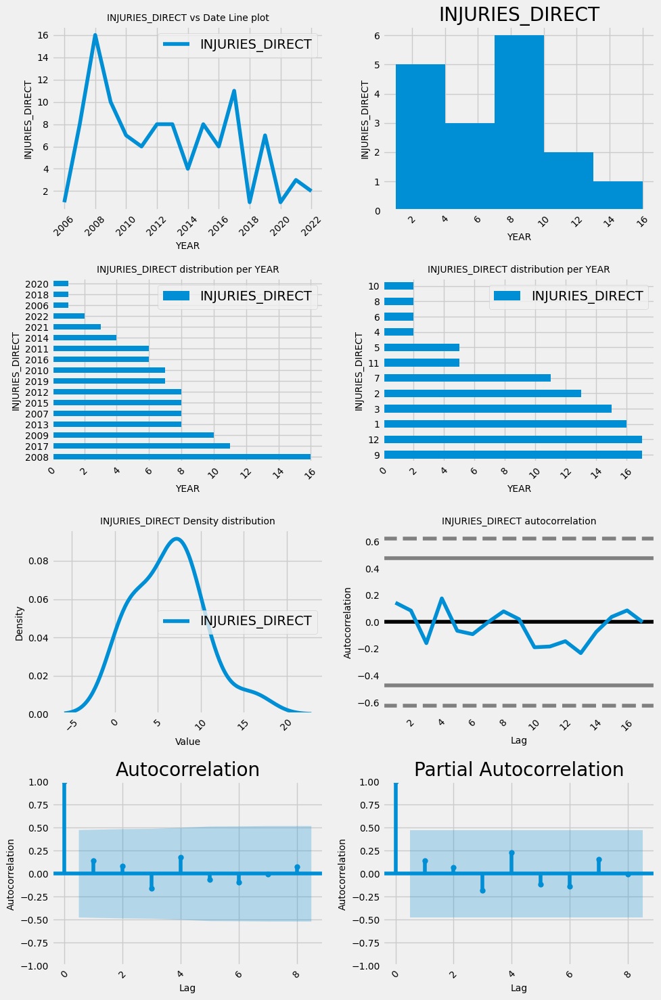

In [54]:
statistics(df_2, var='INJURIES_DIRECT')
targetplot(df_series, var='INJURIES_DIRECT')

Univariate Statistics Analysis

Mean : 0.004114797645710714 
Variance : 0.017171463669253022 
Standard Deviation : 0.004107224005262363 
Skewness : 65.13637084032787 
Kurtosis : 5886.002831740734


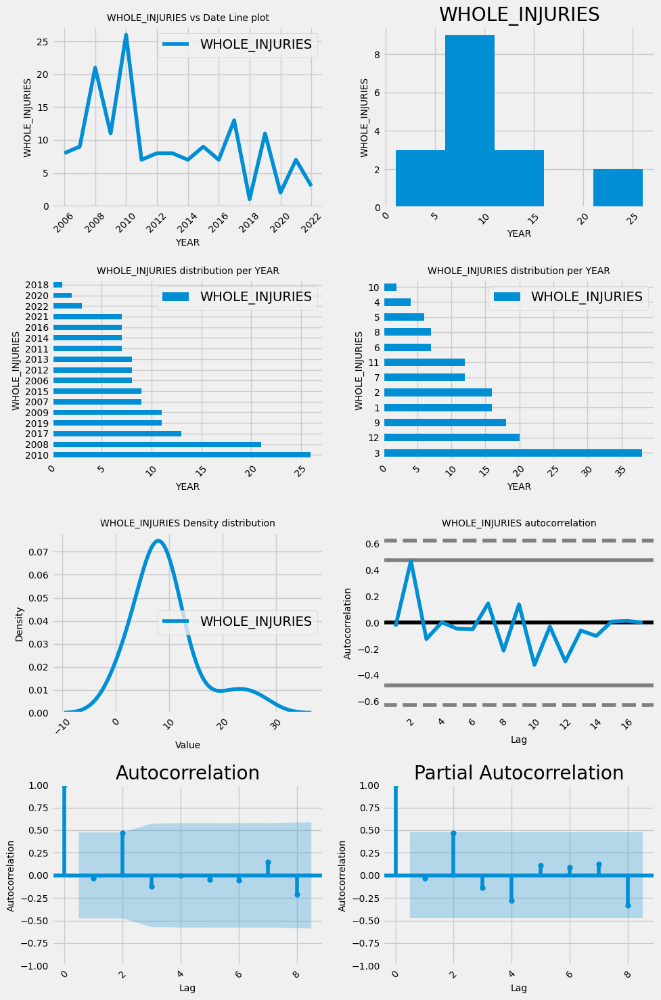

In [55]:
statistics(df_2, var='WHOLE_INJURIES')
targetplot(df_series, var='WHOLE_INJURIES')

Univariate Statistics Analysis

Mean : 0.010599510391166207 
Variance : 0.01861258396975872 
Standard Deviation : 0.010514826769396931 
Skewness : 24.001568245687405 
Kurtosis : 1052.1146470063177


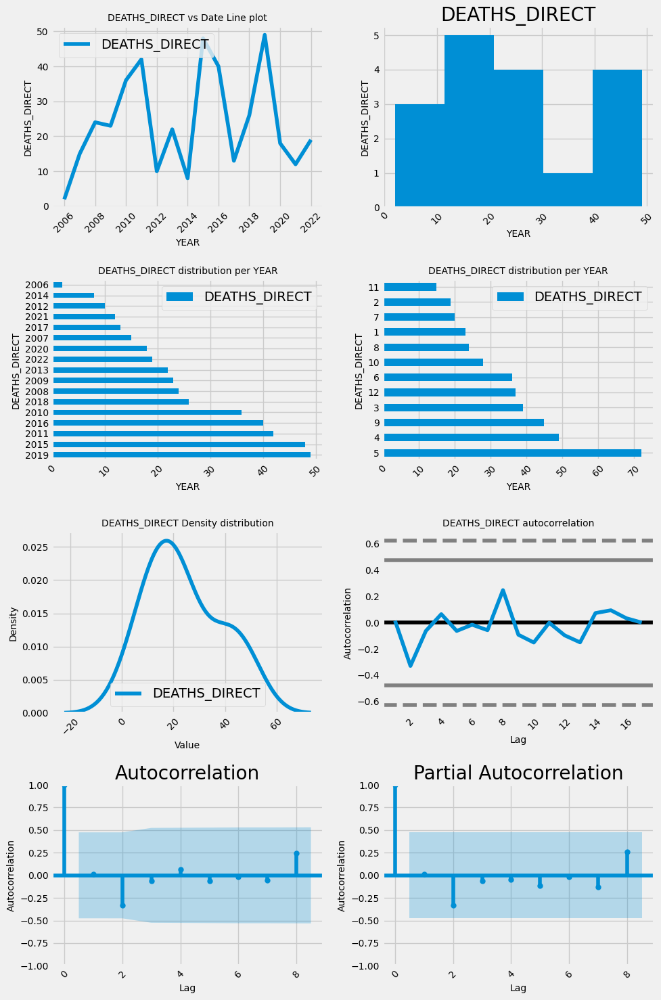

In [56]:
statistics(df_2, var='DEATHS_DIRECT')
targetplot(df_series, var='DEATHS_DIRECT')

Univariate Statistics Analysis

Mean : 0.012083962706390958 
Variance : 0.02094882653534649 
Standard Deviation : 0.011973871912804286 
Skewness : 21.7200804447175 
Kurtosis : 860.2713881396664


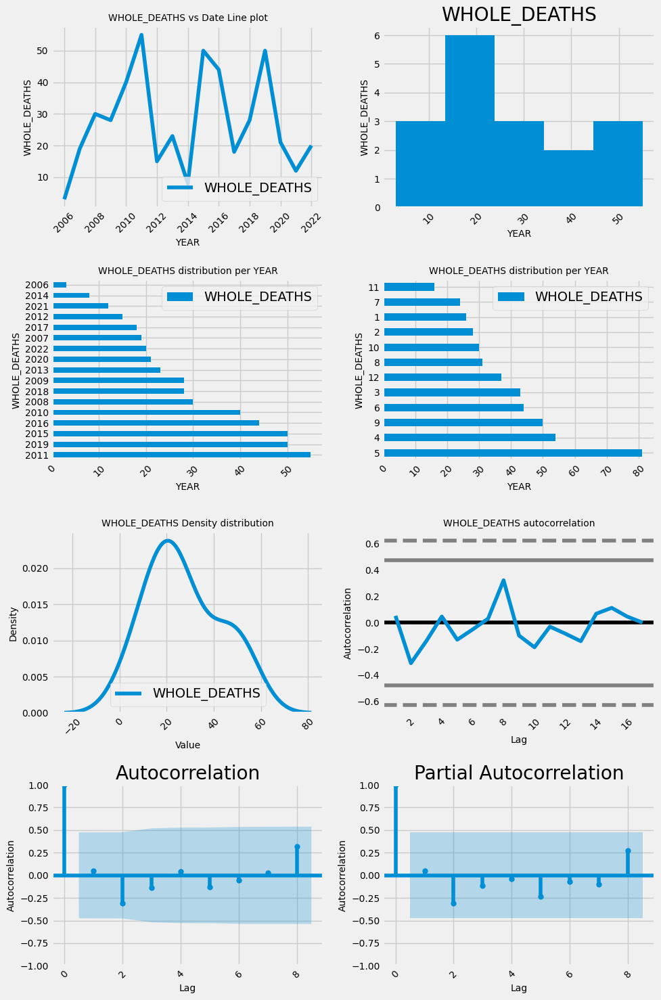

In [57]:
statistics(df_2, var='WHOLE_DEATHS')
targetplot(df_series, var='WHOLE_DEATHS')

Univariate Statistics Analysis

Mean : 702996.1615188291 
Variance : 445747569126608.9 
Standard Deviation : 686160.7816834814 
Skewness : 62.61611594647665 
Kurtosis : 4658.376942807201


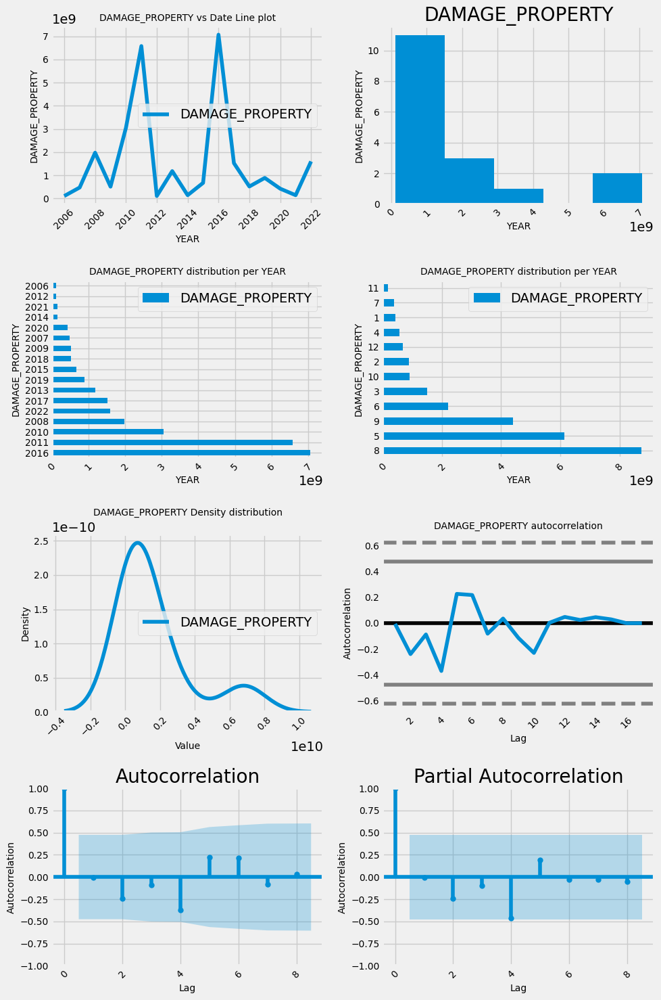

In [58]:
statistics(df_2, var='DAMAGE_PROPERTY')
targetplot(df_2, var='DAMAGE_PROPERTY')

Univariate Statistics Analysis

Mean : 793662.3206937861 
Variance : 458584703863478.3 
Standard Deviation : 772156.1968338237 
Skewness : 60.440617916191 
Kurtosis : 4409.111324512079


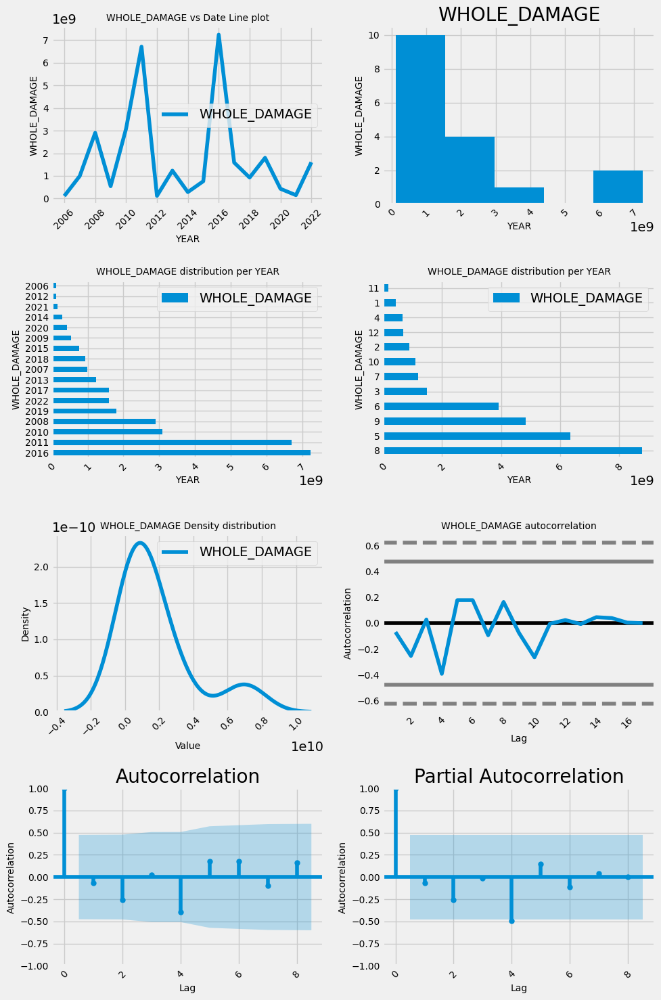

In [59]:
statistics(df_2, var='WHOLE_DAMAGE')
targetplot(df_2, var='WHOLE_DAMAGE')

### Decomposition

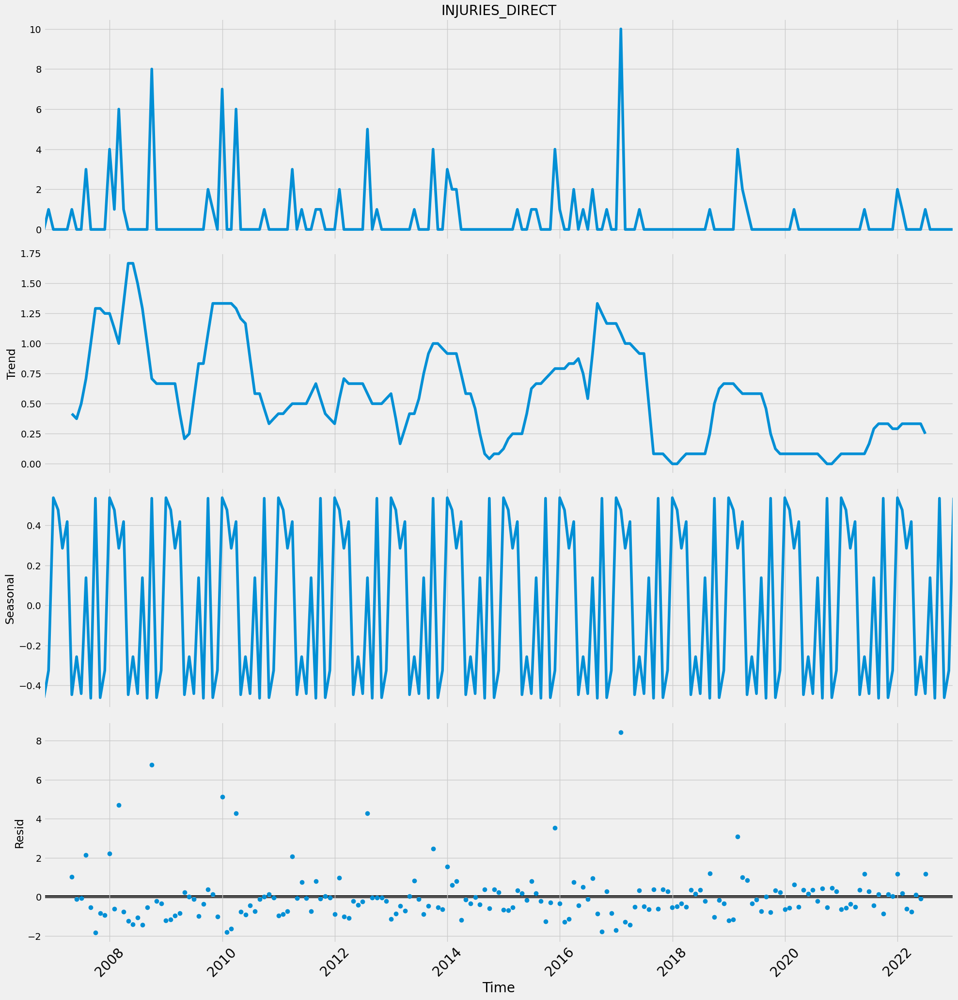

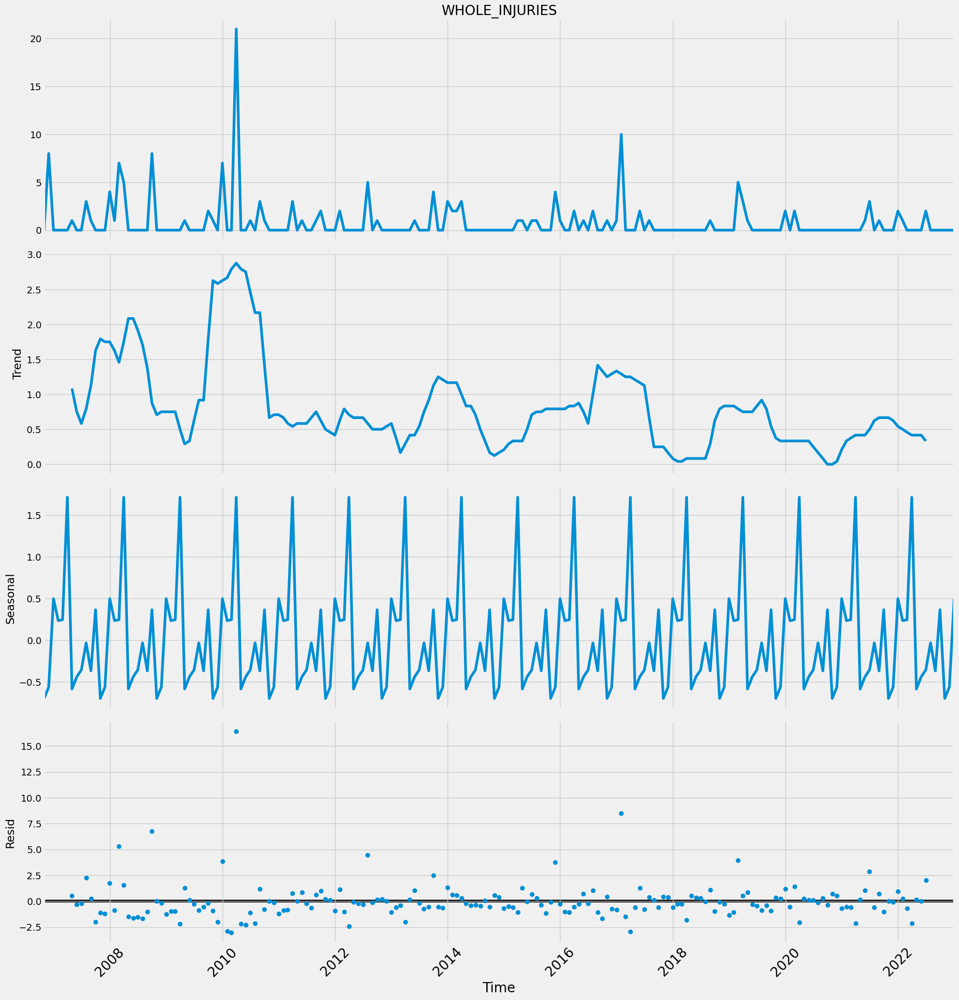

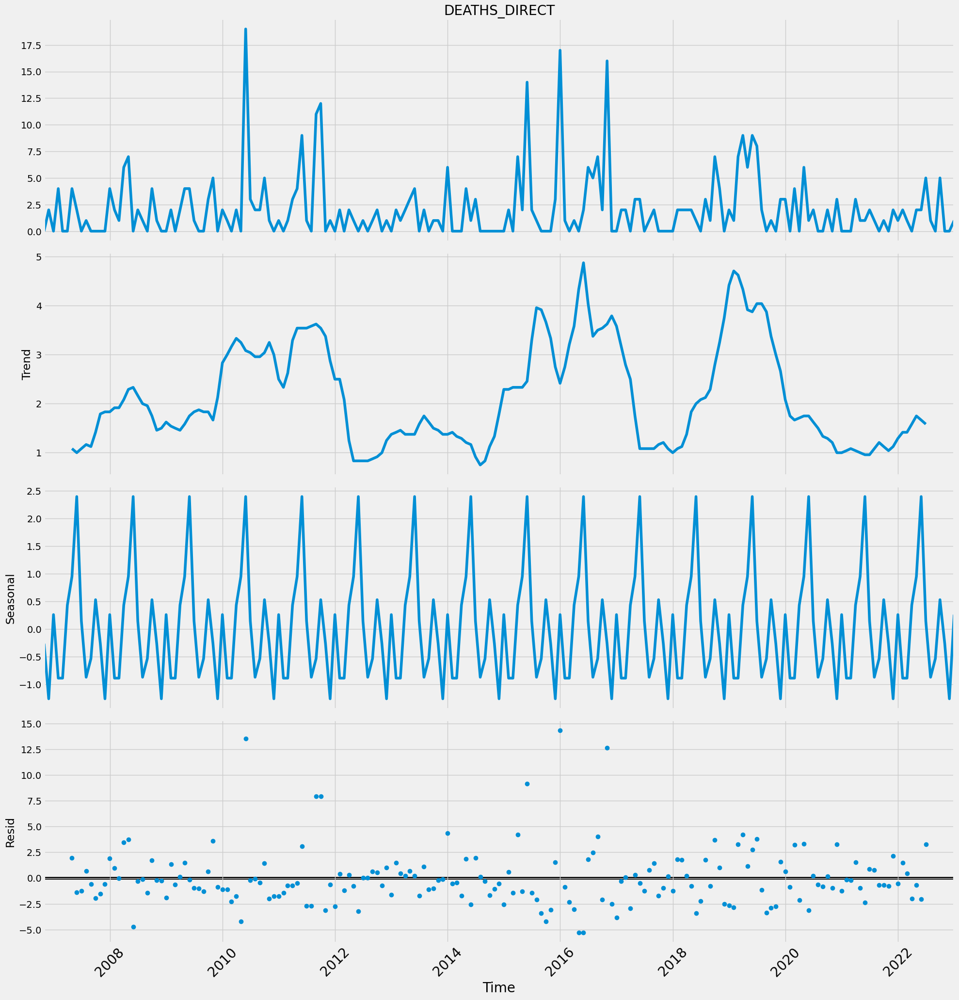

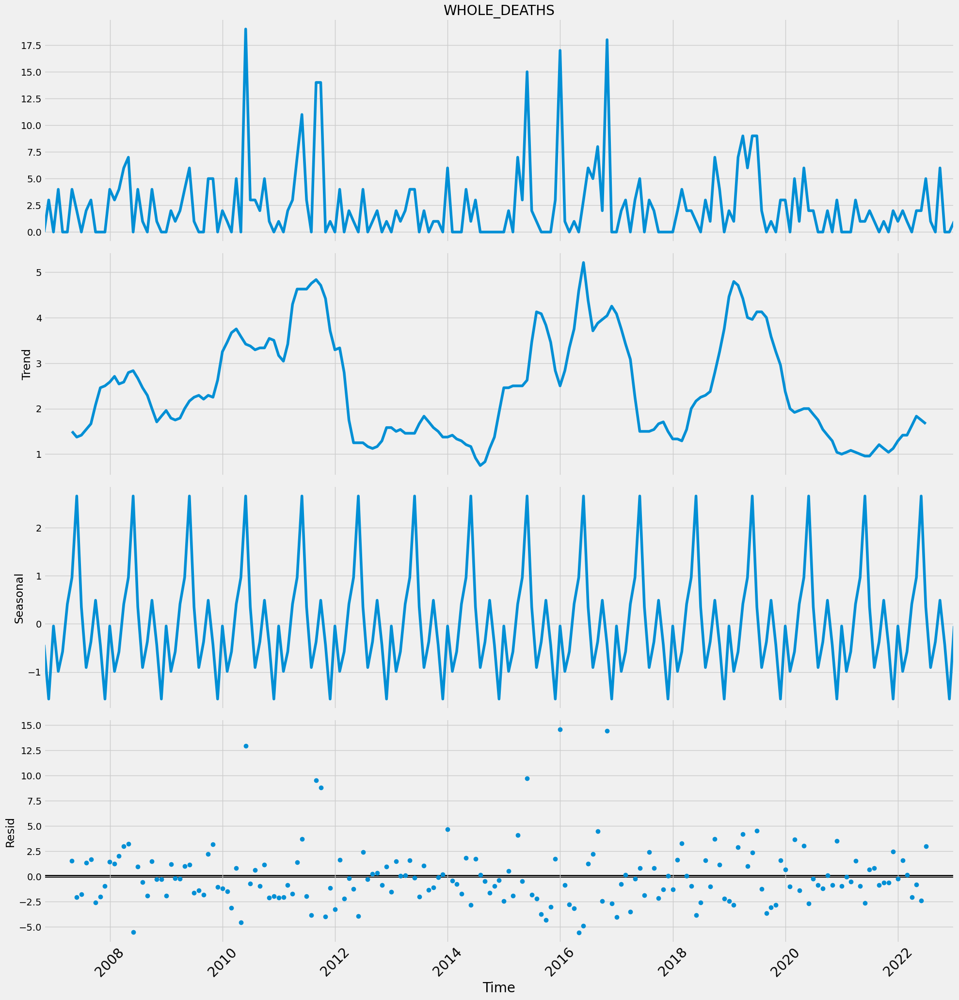

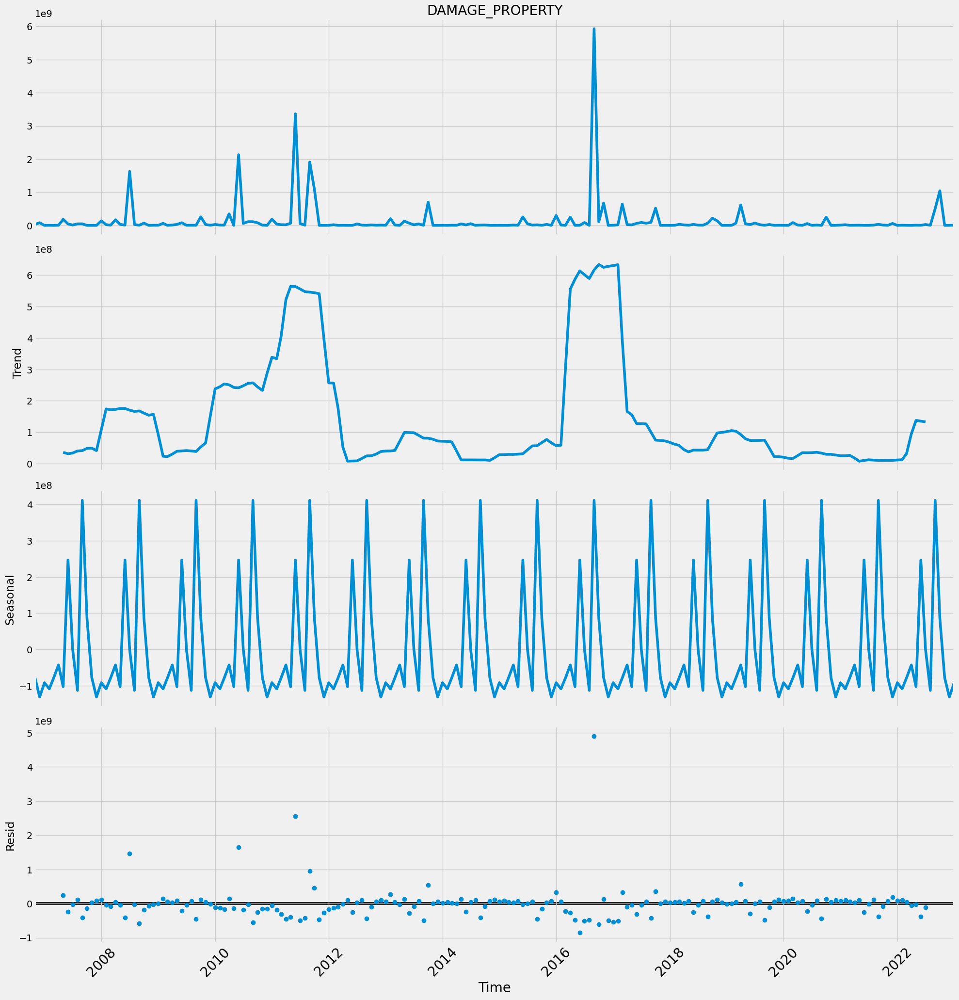

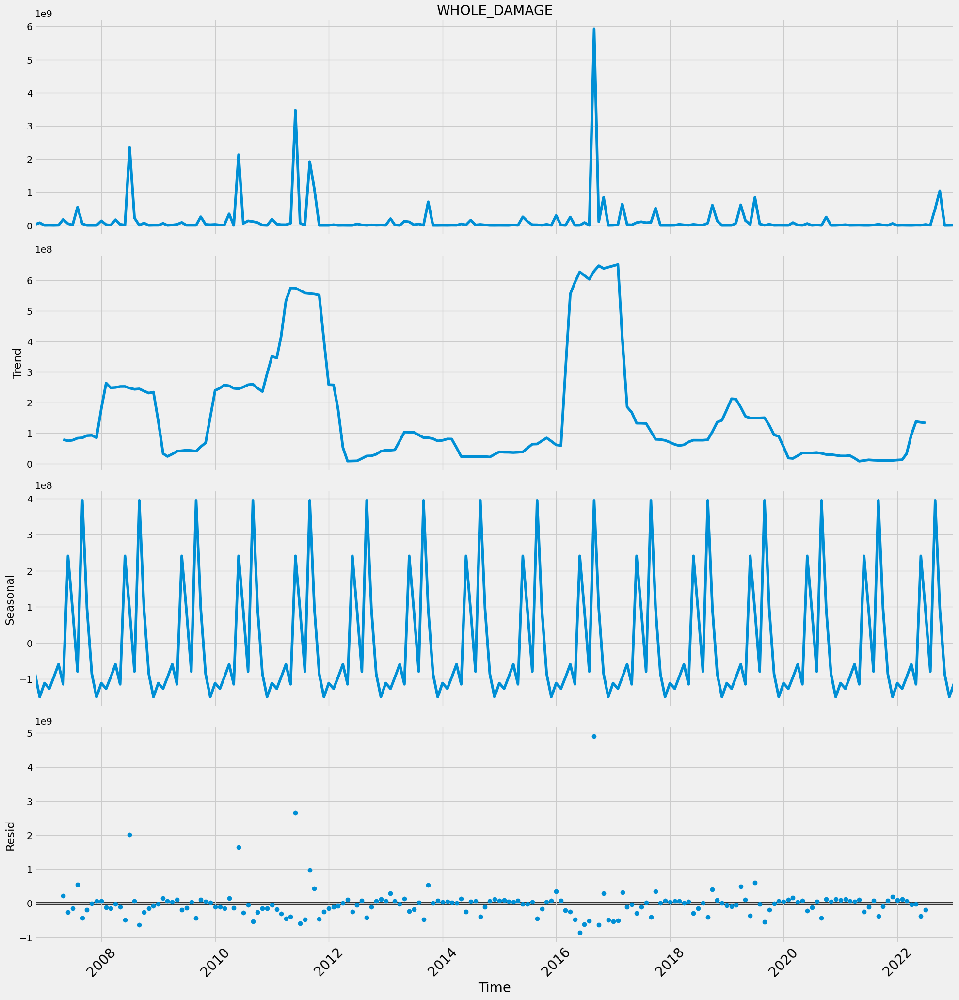

In [60]:
decomposition(df_2, var='INJURIES_DIRECT', model='additive')
decomposition(df_2, var='WHOLE_INJURIES', model='additive')
decomposition(df_2, var='DEATHS_DIRECT', model='additive')
decomposition(df_2, var='WHOLE_DEATHS', model='additive')
decomposition(df_2, var='DAMAGE_PROPERTY', model='additive')
decomposition(df_2, var='WHOLE_DAMAGE', model='additive')

### Stationarity

In [61]:
ADF_test(df_2, var='INJURIES_DIRECT')
ADF_test(df_2, var='WHOLE_INJURIES')
ADF_test(df_2, var='DEATHS_DIRECT')
ADF_test(df_2, var='WHOLE_DEATHS')
ADF_test(df_2, var='DAMAGE_PROPERTY')
ADF_test(df_2, var='WHOLE_DAMAGE')





ADF Statistic: -196.122111
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
ADF Statistic: -45.792641
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
ADF Statistic: -44.021888
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
ADF Statistic: -51.510796
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
ADF Statistic: -25.250976
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
ADF Statistic: -25.285063
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567


In [62]:
#  statistics of partitioned time series
stat_partitioned(df=df_2, var='INJURIES_DIRECT')

mean1=0.004115, mean2=0.001458
variance1=0.010661, variance2=0.006665


In [63]:
#  statistics of log partitioned time series
stat_log_partitioned(df=df_2, var='INJURIES_DIRECT')

mean1=0.002208, mean2=0.000709
variance1=0.002366, variance2=0.000800


In [64]:
#  statistics of box-cox partitioned time series
stat_boxcox_partitioned(df=df_2, var='INJURIES_DIRECT', lmbda=0.3)


mean1=-3.324419, mean2=-3.330408
variance1=0.034859, variance2=0.011535


In [65]:
#  statistics of partitioned time series
stat_partitioned(df=df_2, var='WHOLE_INJURIES')

mean1=0.006094, mean2=0.002136
variance1=0.026475, variance2=0.007860


In [66]:
#  statistics of log partitioned time series
stat_log_partitioned(df=df_2, var='WHOLE_INJURIES')


mean1=0.002951, mean2=0.001112
variance1=0.003451, variance2=0.001175


In [67]:
#  statistics of box-cox partitioned time series
stat_boxcox_partitioned(df=df_2, var='WHOLE_INJURIES', lmbda=0.3)


mean1=-3.321631, mean2=-3.328698
variance1=0.047345, variance2=0.017867


In [68]:
#  statistics of partitioned time series
stat_partitioned(df=df_2, var='DEATHS_DIRECT')


mean1=0.013022, mean2=0.008178
variance1=0.025144, variance2=0.012069


In [69]:
#  statistics of log partitioned time series
stat_log_partitioned(df=df_2, var='DEATHS_DIRECT')

mean1=0.007911, mean2=0.005238
variance1=0.006870, variance2=0.004191


In [70]:
#  statistics of box-cox partitioned time series
stat_boxcox_partitioned(df=df_2, var='DEATHS_DIRECT', lmbda=0.3)


mean1=-3.298352, mean2=-3.309418
variance1=0.124624, variance2=0.082907


In [71]:
#  statistics of partitioned time series
stat_partitioned(df=df_2, var='WHOLE_DEATHS')

mean1=0.015261, mean2=0.008907
variance1=0.028987, variance2=0.012890


In [72]:
#  statistics of log partitioned time series
stat_log_partitioned(df=df_2, var='WHOLE_DEATHS')

mean1=0.009271, mean2=0.005728
variance1=0.008059, variance2=0.004549


In [73]:
#  statistics of box-cox partitioned time series
stat_boxcox_partitioned(df=df_2, var='WHOLE_DEATHS', lmbda=0.3)

mean1=-3.292411, mean2=-3.307121
variance1=0.145718, variance2=0.090614


In [74]:
#  statistics of partitioned time series
stat_partitioned(df=df_2, var='DAMAGE_PROPERTY')

mean1=821606.718579, mean2=584385.604459
variance1=485534021285835.937500, variance2=405932980038889.750000


In [75]:
#  statistics of log partitioned time series
stat_log_partitioned(df=df_2, var='DAMAGE_PROPERTY')

mean1=3.691901, mean2=2.002287
variance1=26.754153, variance2=16.553407


In [76]:
#  statistics of box-cox partitioned time series
stat_boxcox_partitioned(df=df_2, var='DAMAGE_PROPERTY', lmbda=0.3)

mean1=33.948658, mean2=14.820761
variance1=7488.964617, variance2=4195.224735


In [77]:
#  statistics of partitioned time series
stat_partitioned(df=df_2, var='WHOLE_DAMAGE')

mean1=930683.579353, mean2=656641.062034
variance1=508481158514571.500000, variance2=408650699561735.750000


In [78]:
#  statistics of log partitioned time series
stat_log_partitioned(df=df_2, var='WHOLE_DAMAGE')

mean1=3.874643, mean2=2.115195
variance1=27.771115, variance2=17.705942


In [79]:
#  statistics of box-cox partitioned time series
stat_boxcox_partitioned(df=df_2, var='WHOLE_DAMAGE', lmbda=0.3)

mean1=36.710413, mean2=17.051326
variance1=8289.641964, variance2=5034.607772


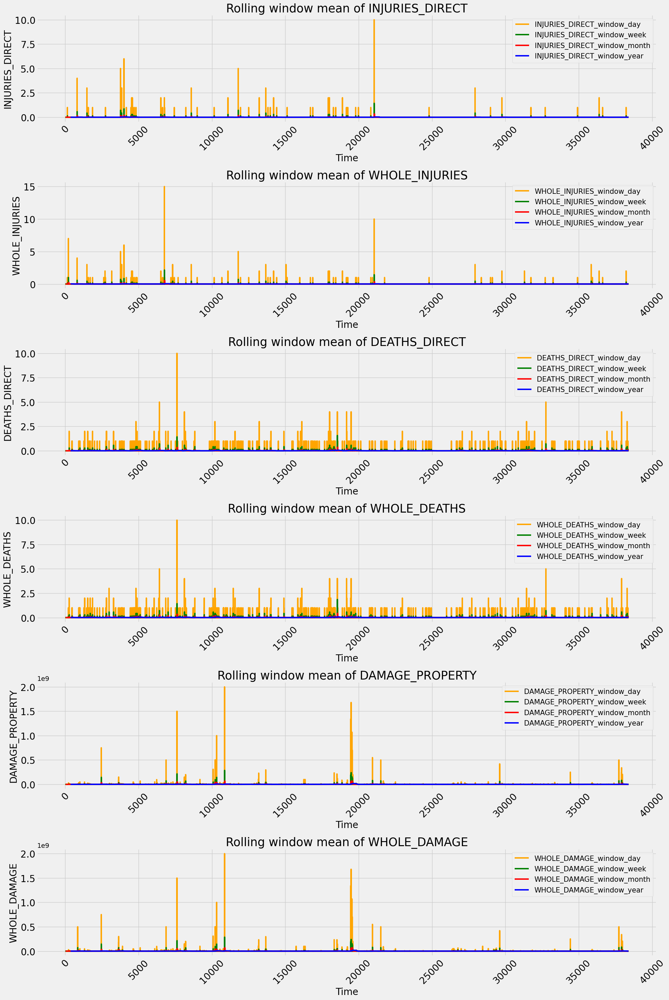

In [80]:
# Plot rolling window
plot_rolling_window(df=df_2)


### CATEGORICAL ANALYSIS

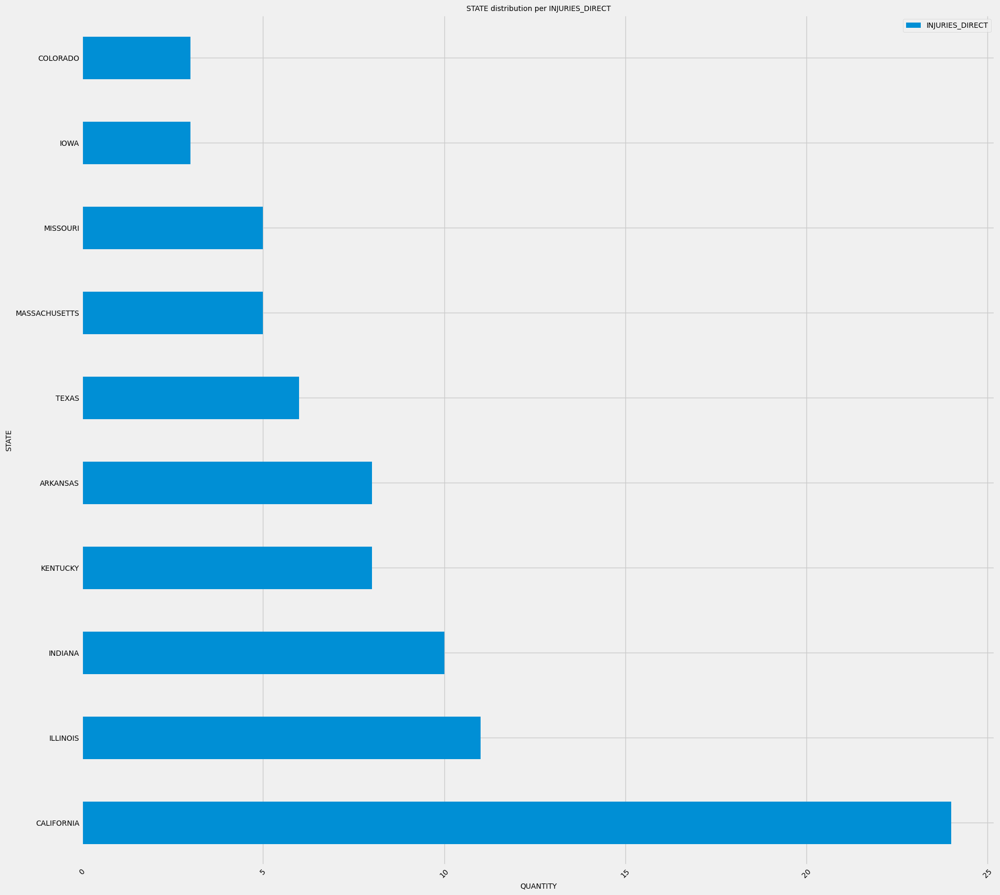

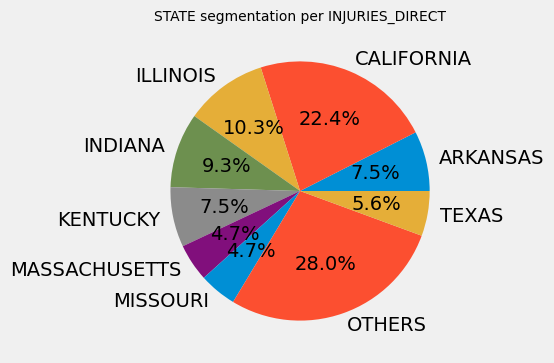

In [81]:
catplot(df_2, var_c='STATE', var_t='INJURIES_DIRECT', threshold=5)

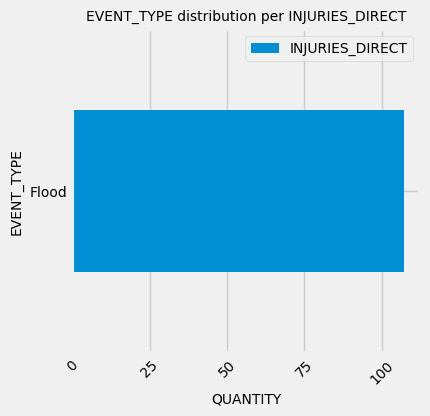

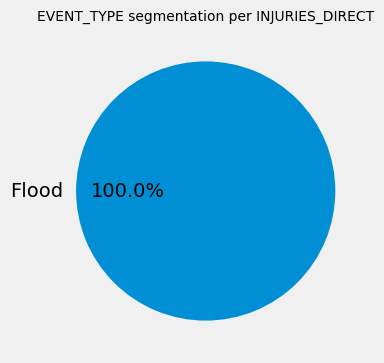

In [82]:
catplot(df_2, var_c='EVENT_TYPE', var_t='INJURIES_DIRECT',threshold=5)

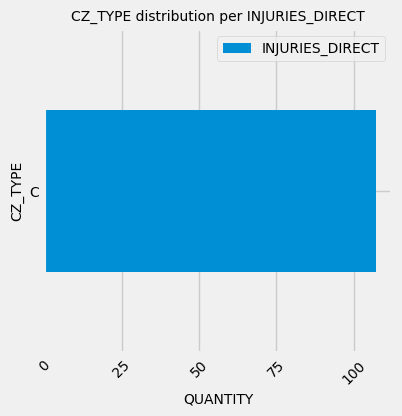

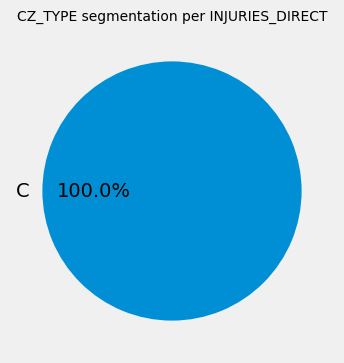

In [83]:
catplot(df_2, var_c='CZ_TYPE', var_t='INJURIES_DIRECT',threshold=5)

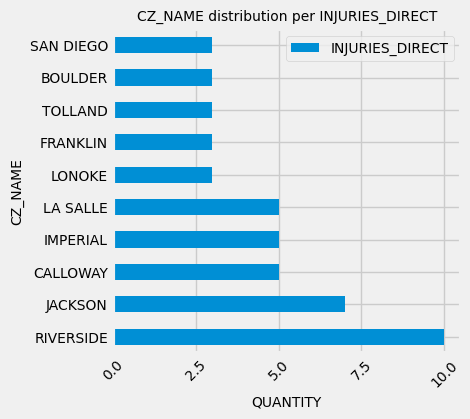

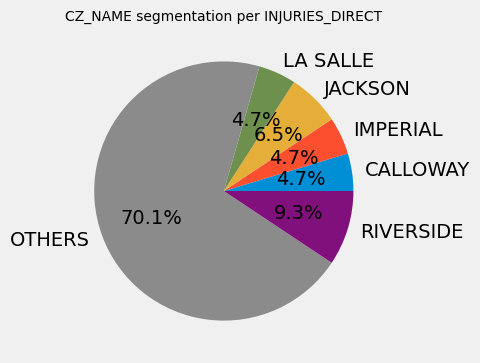

In [84]:
catplot(df_2, var_c='CZ_NAME', var_t='INJURIES_DIRECT',threshold=5)

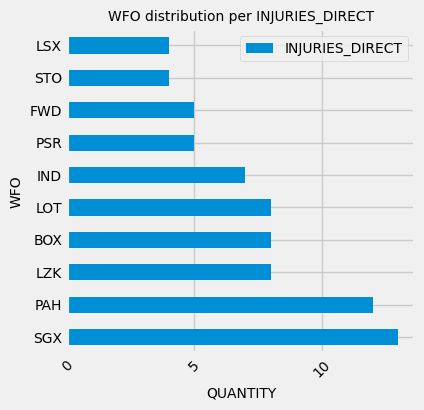

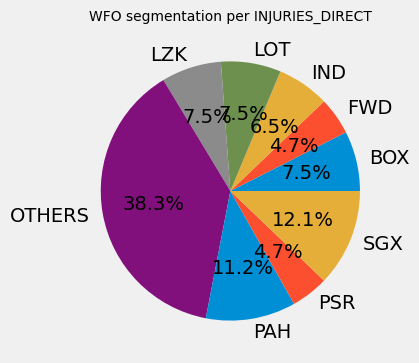

In [85]:
catplot(df_2, var_c='WFO', var_t='INJURIES_DIRECT',threshold=5)


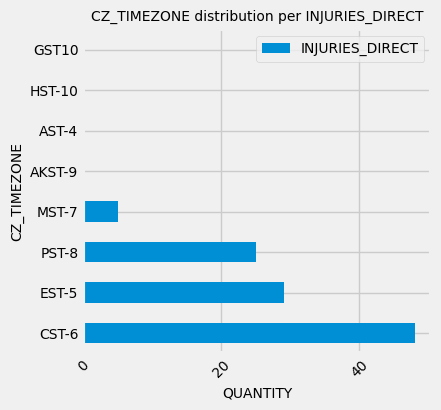

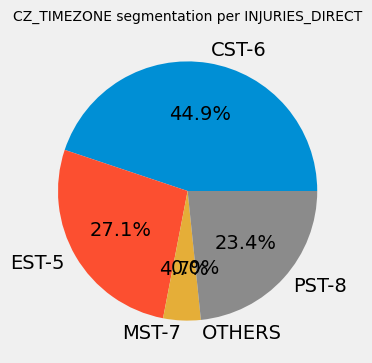

In [86]:
catplot(df_2, var_c='CZ_TIMEZONE', var_t='INJURIES_DIRECT',threshold=5)

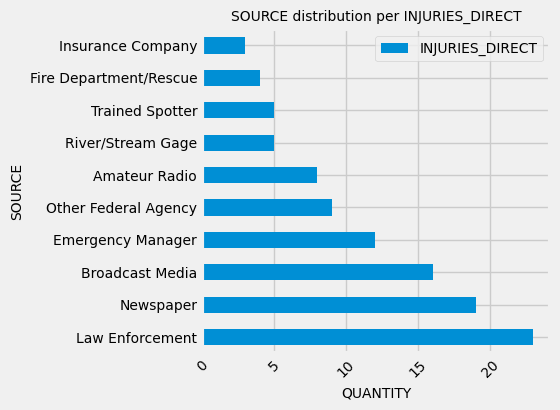

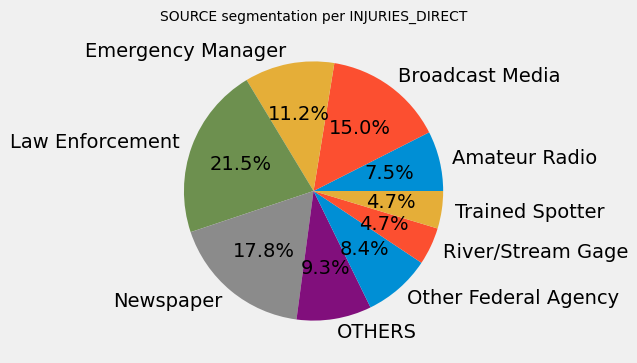

In [87]:
catplot(df_2, var_c='SOURCE', var_t='INJURIES_DIRECT',threshold=5)


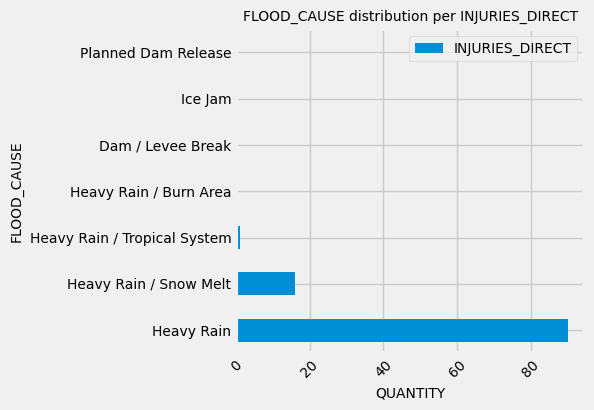

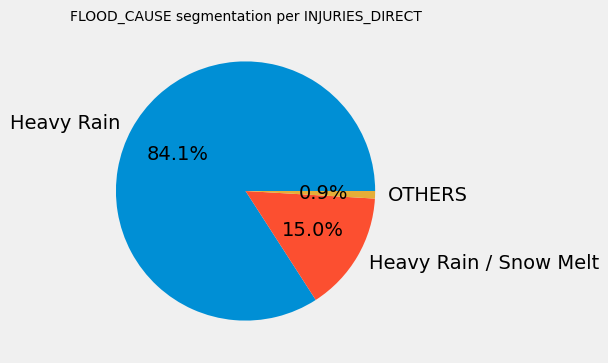

In [88]:
catplot(df_2, var_c='FLOOD_CAUSE', var_t='INJURIES_DIRECT',threshold=5)


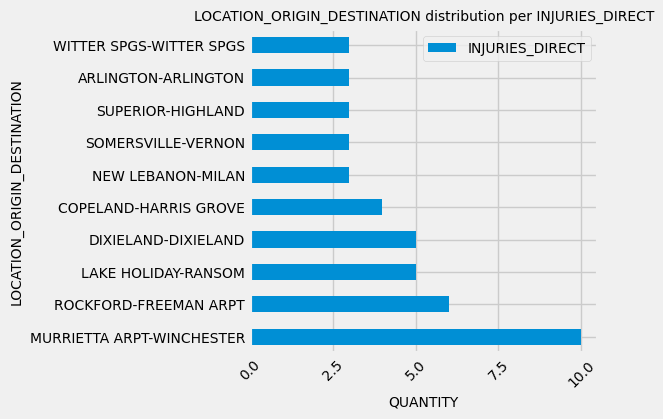

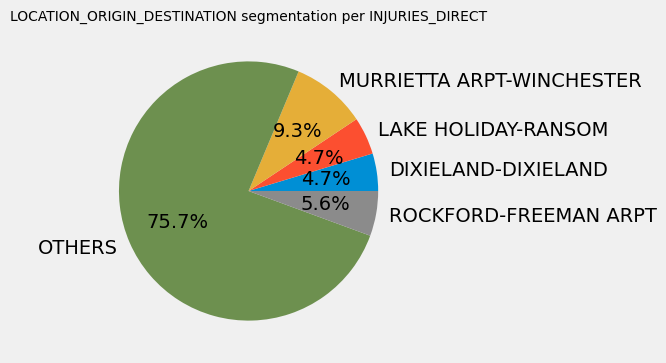

In [89]:
catplot(df_2, var_c='LOCATION_ORIGIN_DESTINATION', var_t='INJURIES_DIRECT',threshold=5)


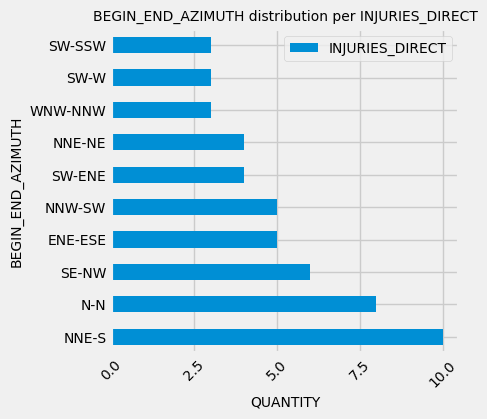

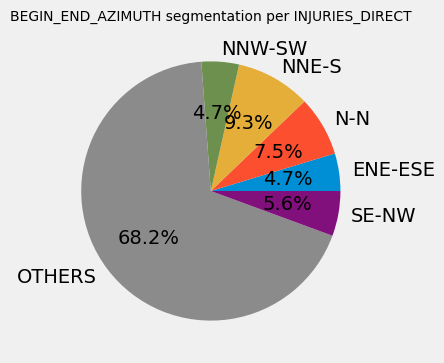

In [90]:
catplot(df_2, var_c='BEGIN_END_AZIMUTH', var_t='INJURIES_DIRECT',threshold=5)


### NUMERICAL ANALYSIS

In [91]:
num_cols = [cname for cname in df_2.columns if
       df_2[cname].dtype in ['float64','int64']]
num = df_2[num_cols]

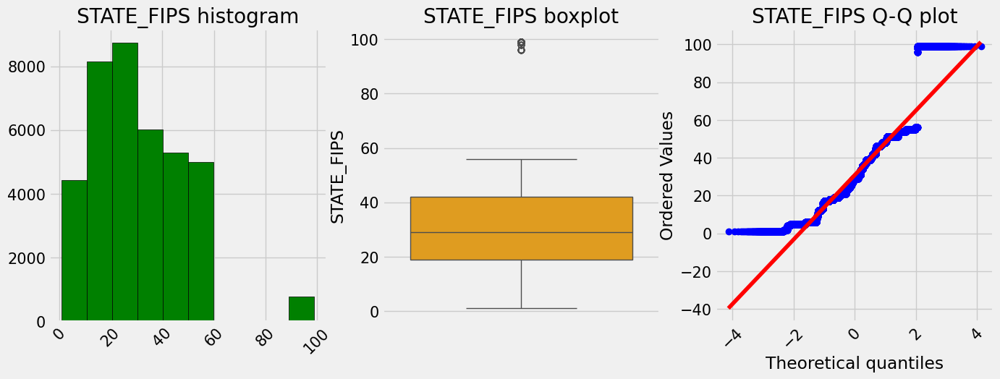

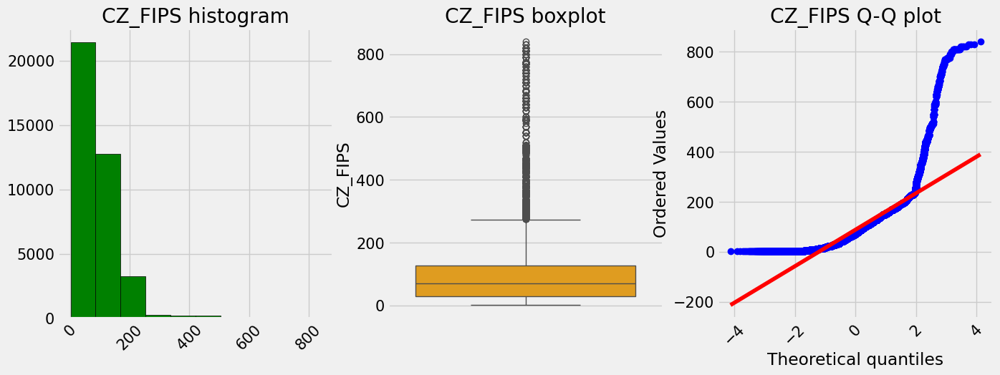

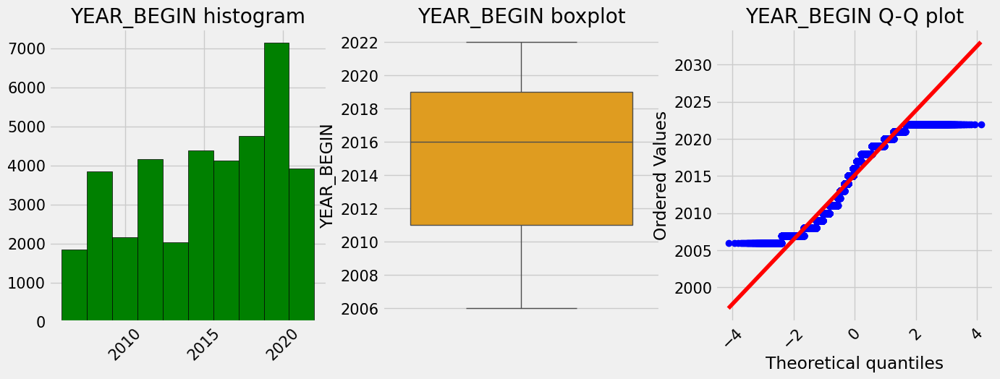

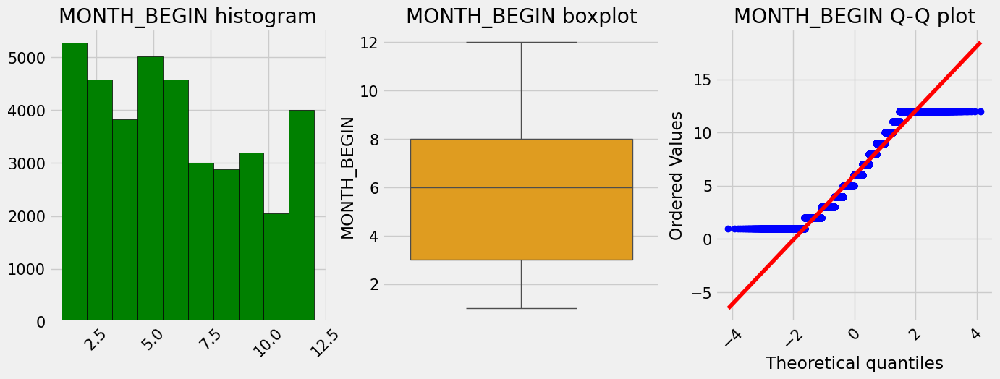

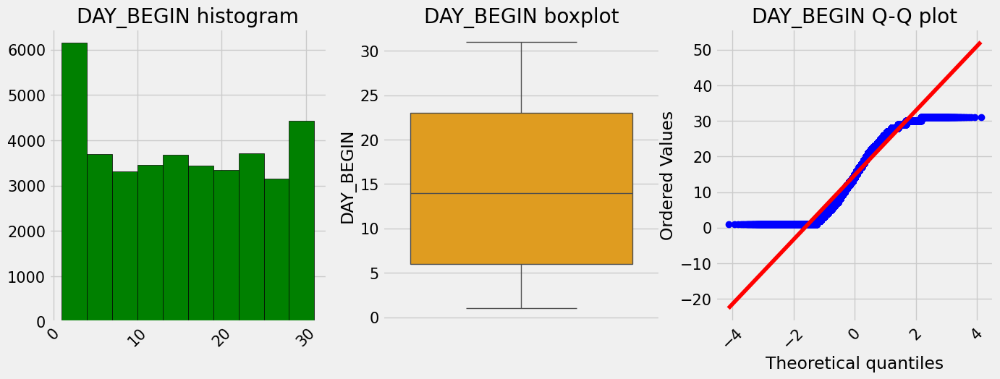

...

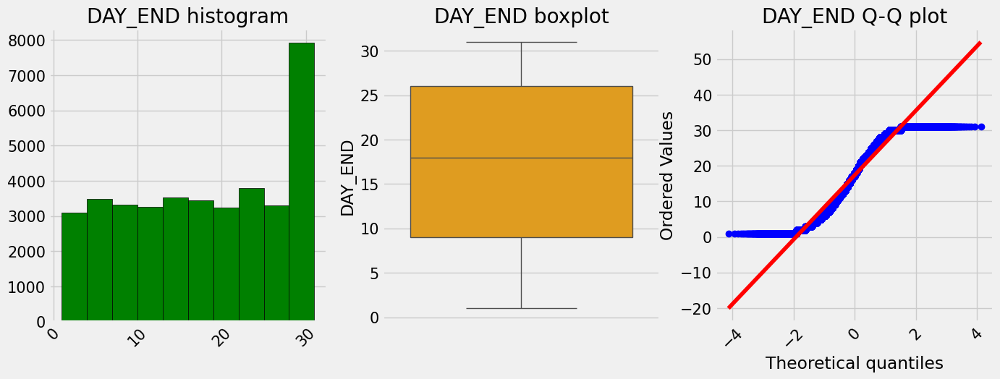

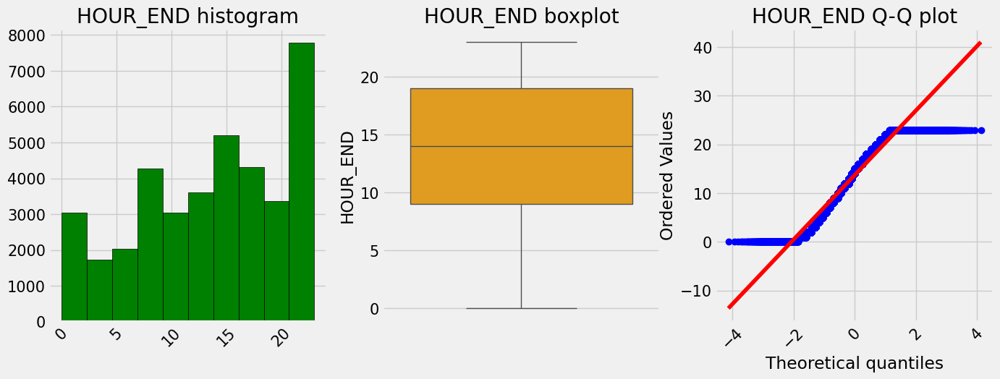

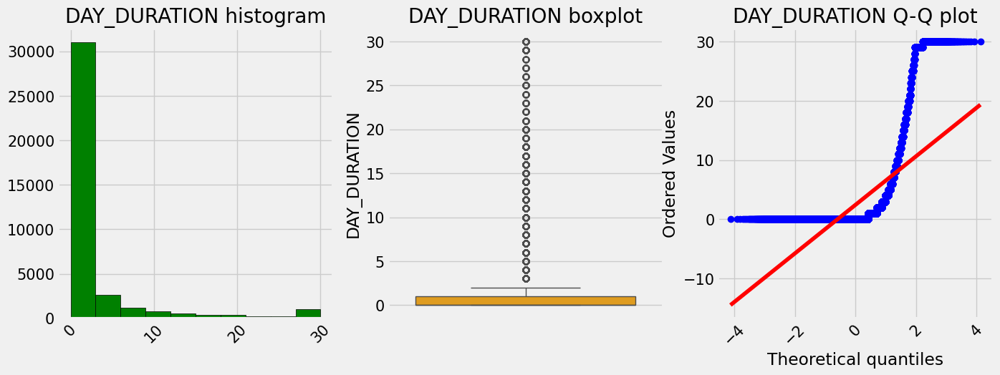

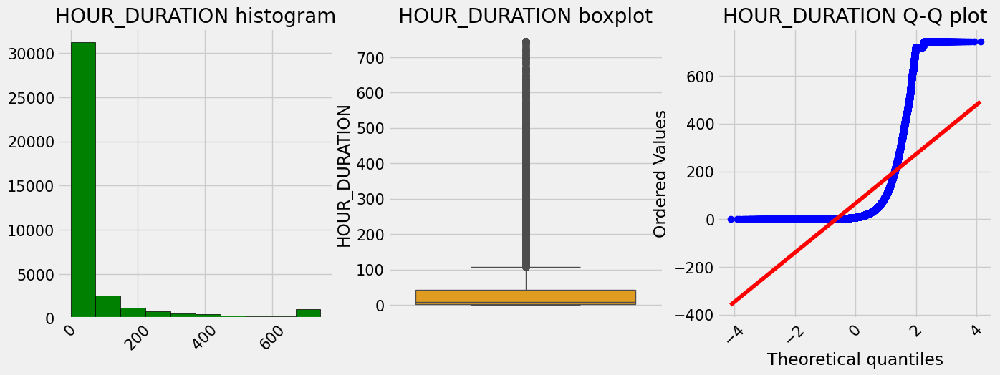

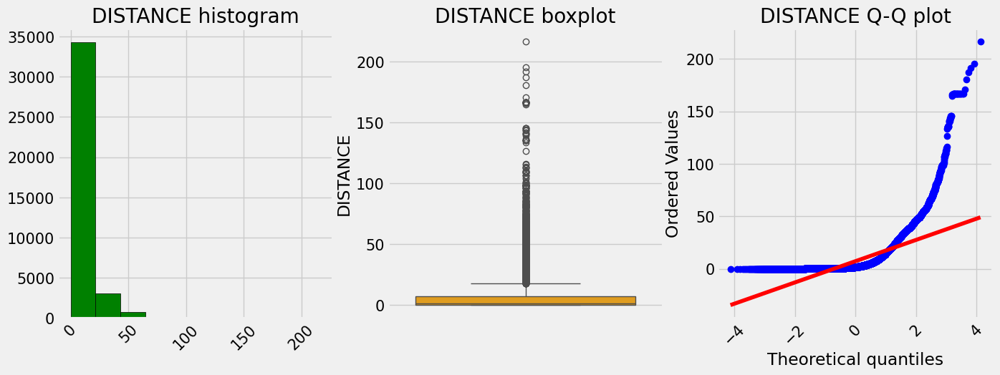

In [92]:
plot_num(num, var='STATE_FIPS')
plot_num(num, var='CZ_FIPS')
plot_num(num, var='YEAR_BEGIN')
plot_num(num, var='MONTH_BEGIN')
plot_num(num, var='DAY_BEGIN')
plot_num(num, var='HOUR_BEGIN')
plot_num(num, var='YEAR_END')
plot_num(num, var='MONTH_END')
plot_num(num, var='DAY_END')
plot_num(num, var='HOUR_END')
plot_num(num, var='DAY_DURATION')
plot_num(num, var='HOUR_DURATION')
plot_num(num, var='DISTANCE')

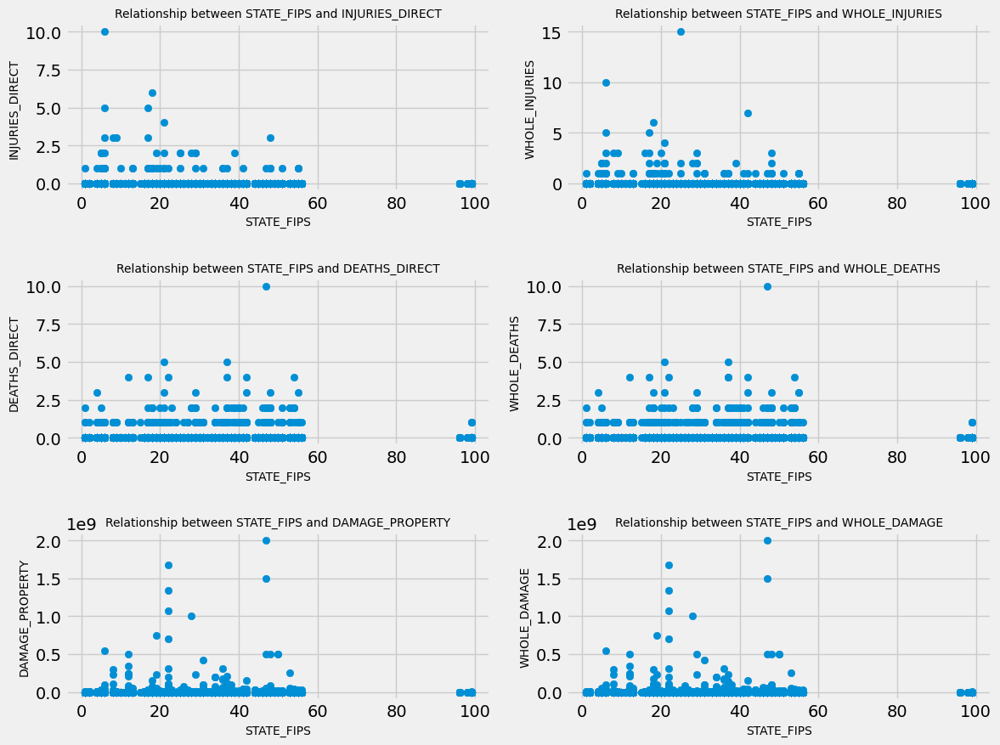

In [93]:
numscatterplot(num, var='STATE_FIPS', target=targets)

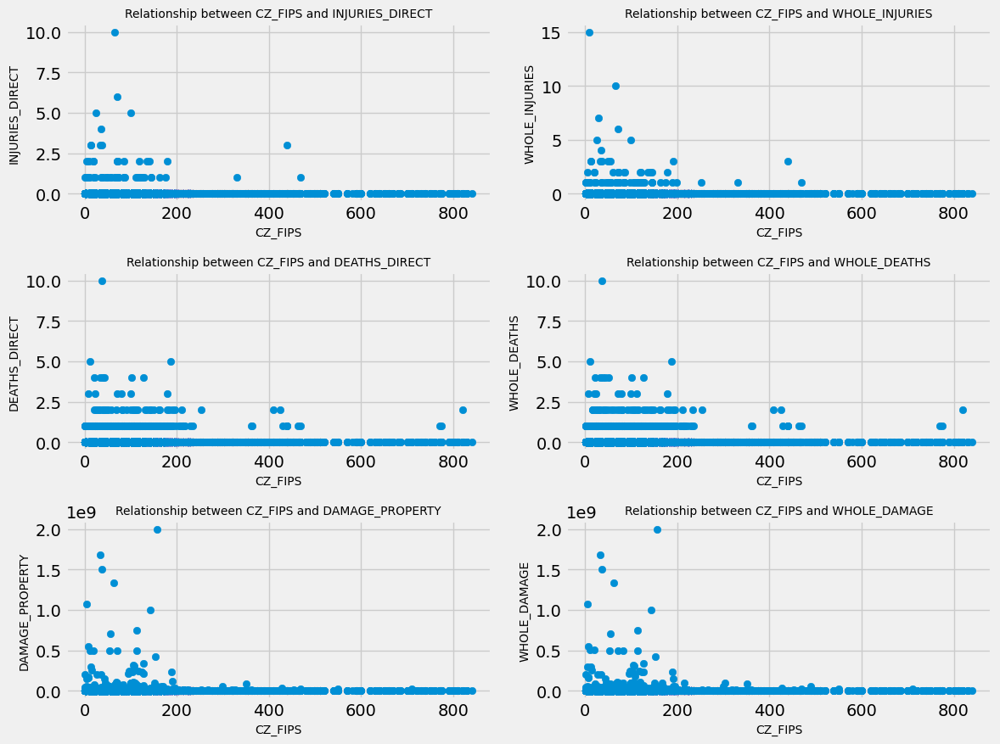

In [94]:
numscatterplot(num, var='CZ_FIPS', target=targets)

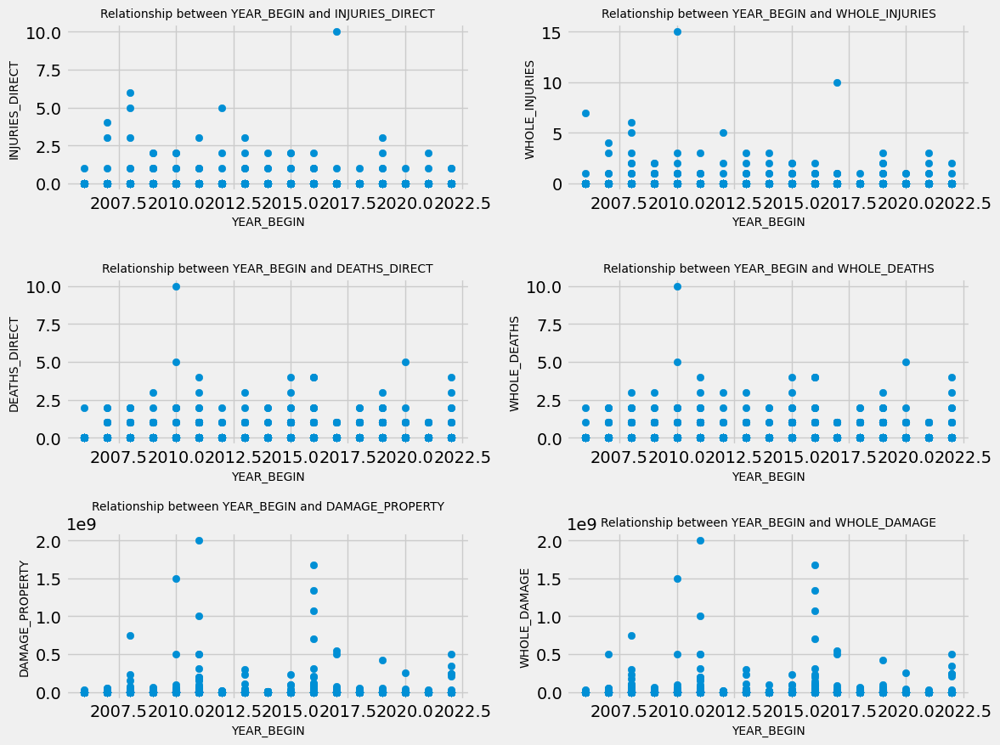

In [95]:
numscatterplot(num, var='YEAR_BEGIN', target=targets)

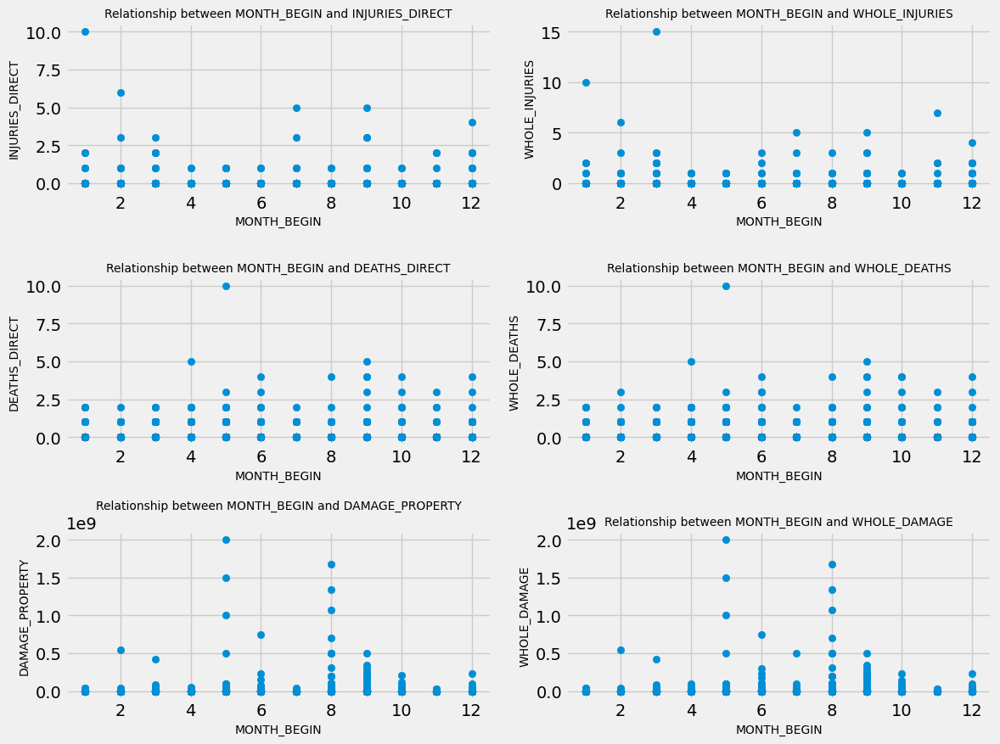

In [96]:
numscatterplot(num, var='MONTH_BEGIN', target=targets)

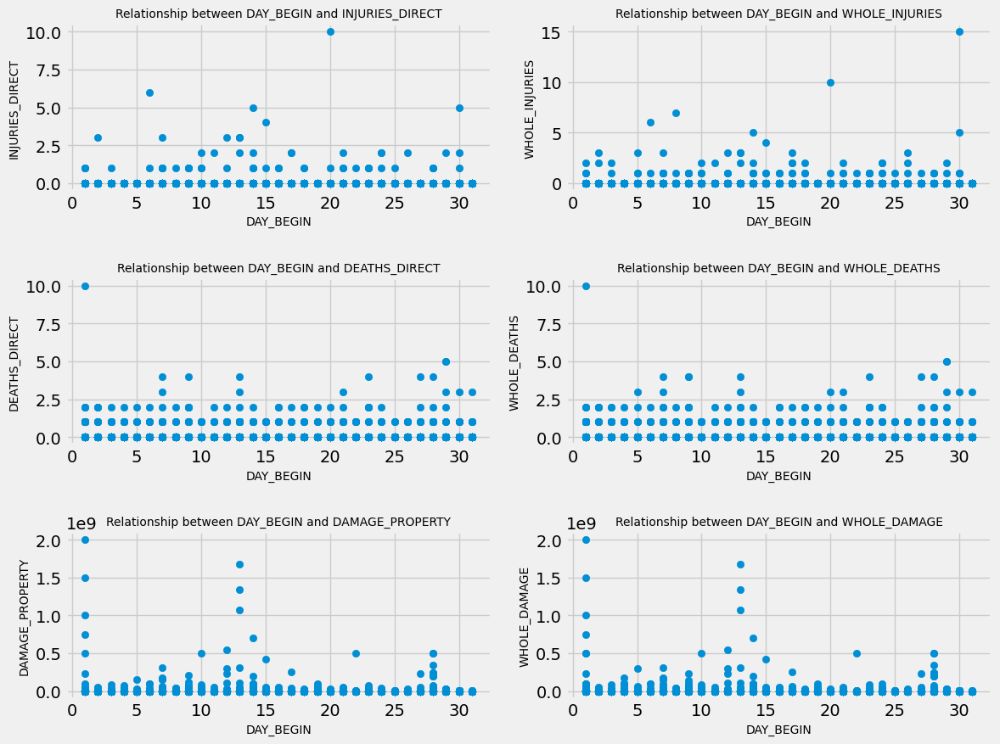

In [97]:
numscatterplot(num, var='DAY_BEGIN', target=targets)

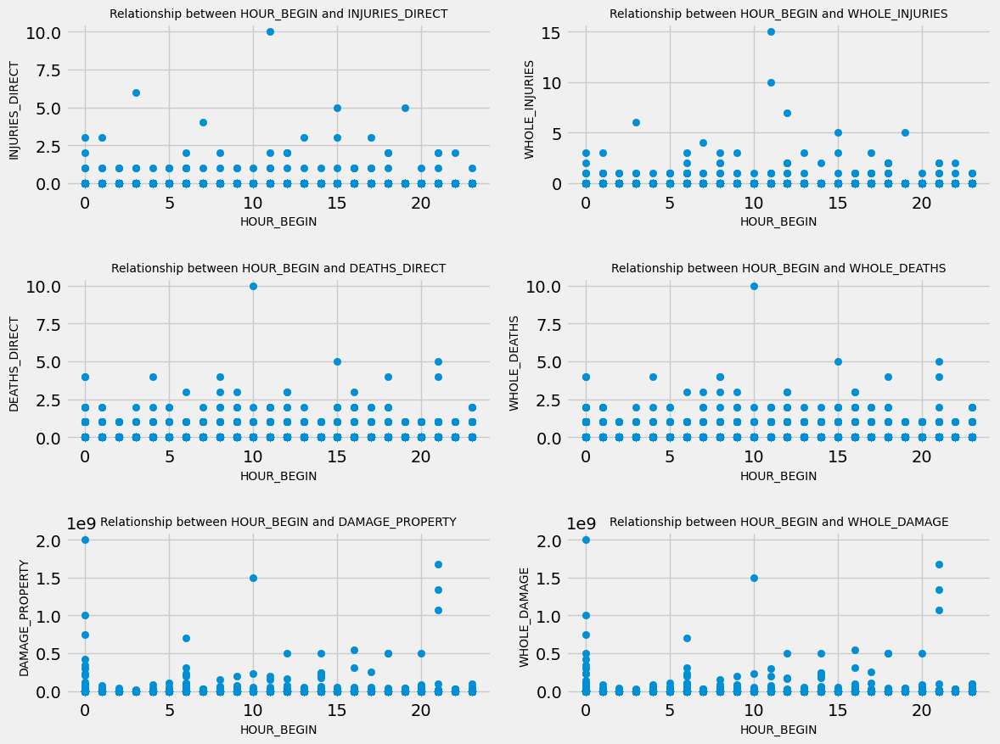

In [98]:
numscatterplot(num, var='HOUR_BEGIN', target=targets)

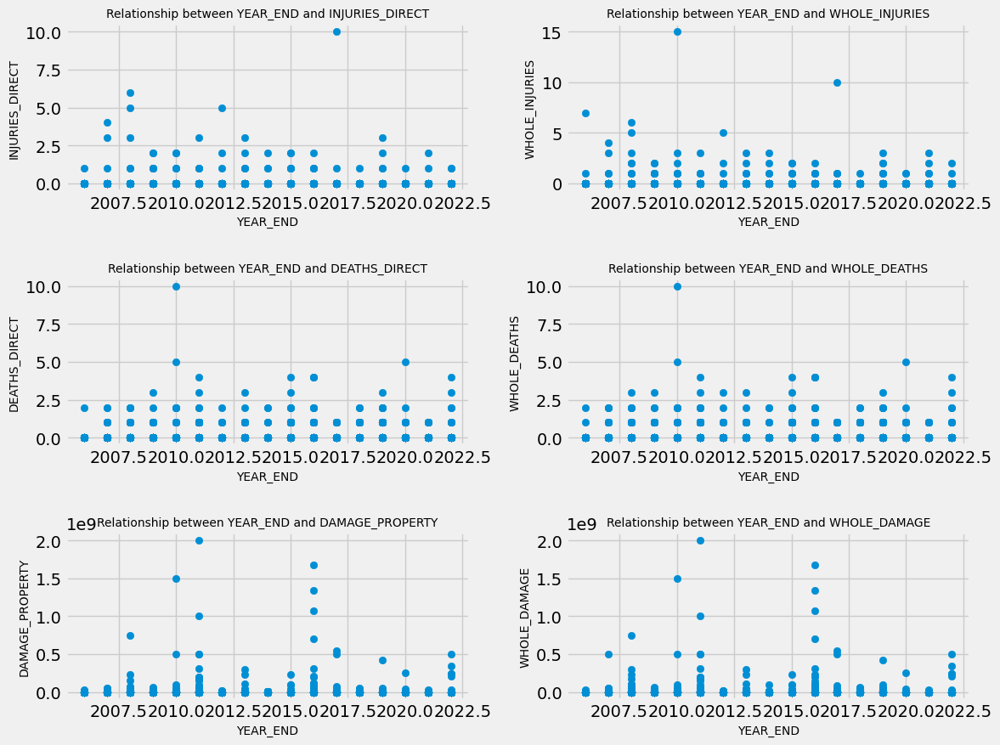

In [99]:
numscatterplot(num, var='YEAR_END', target=targets)

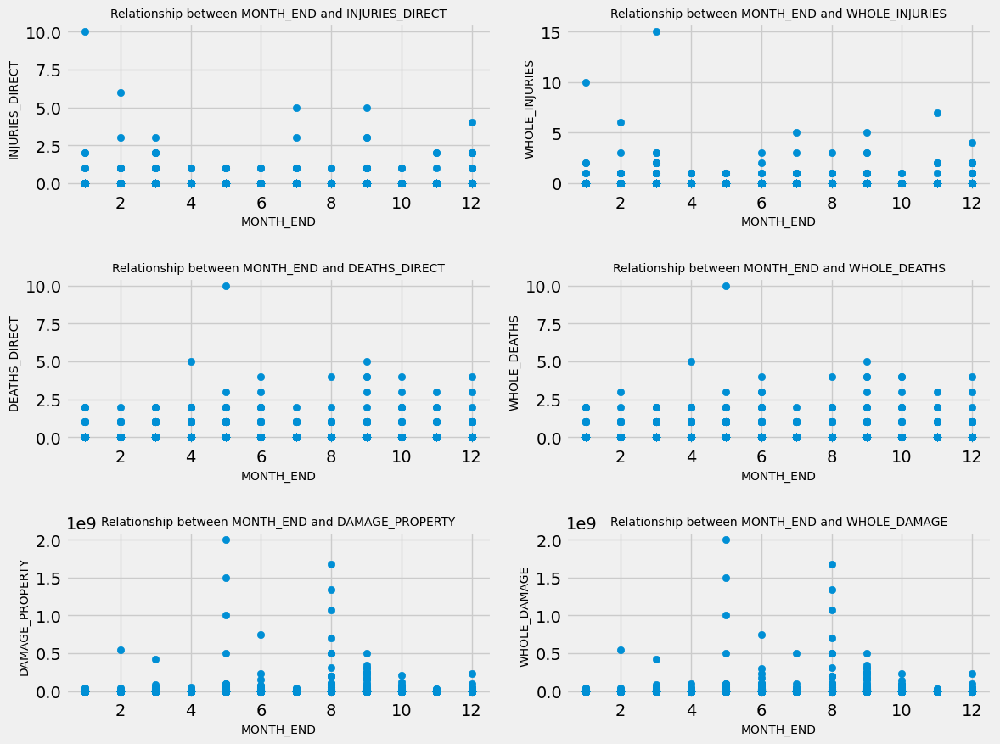

In [100]:
numscatterplot(num, var='MONTH_END', target=targets)

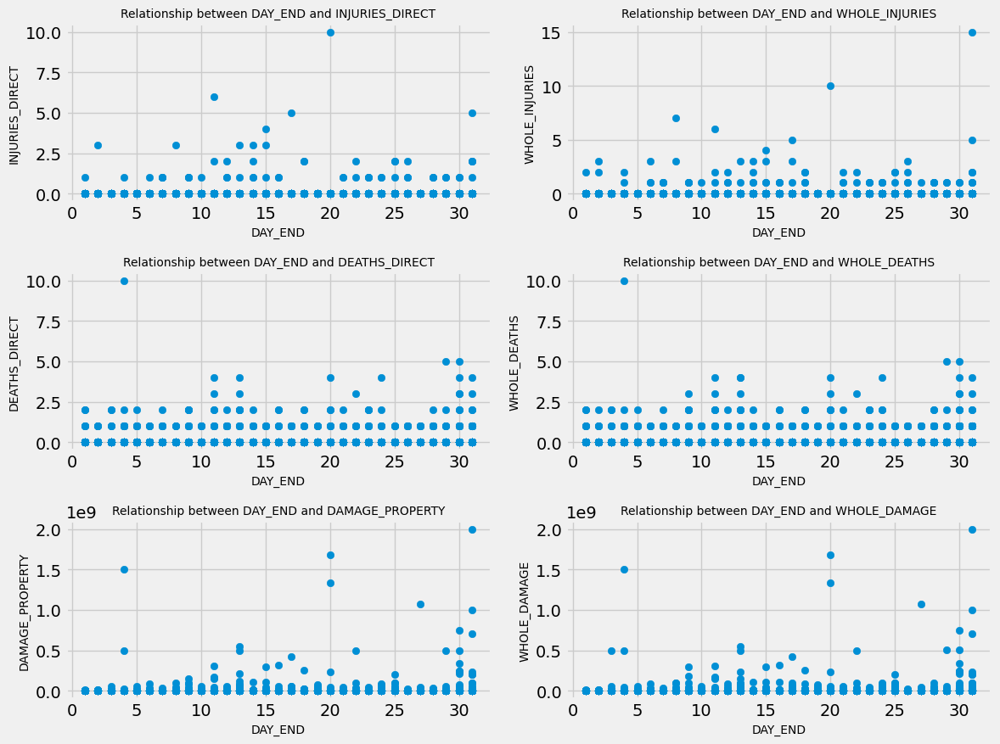

In [101]:
numscatterplot(num, var='DAY_END', target=targets)

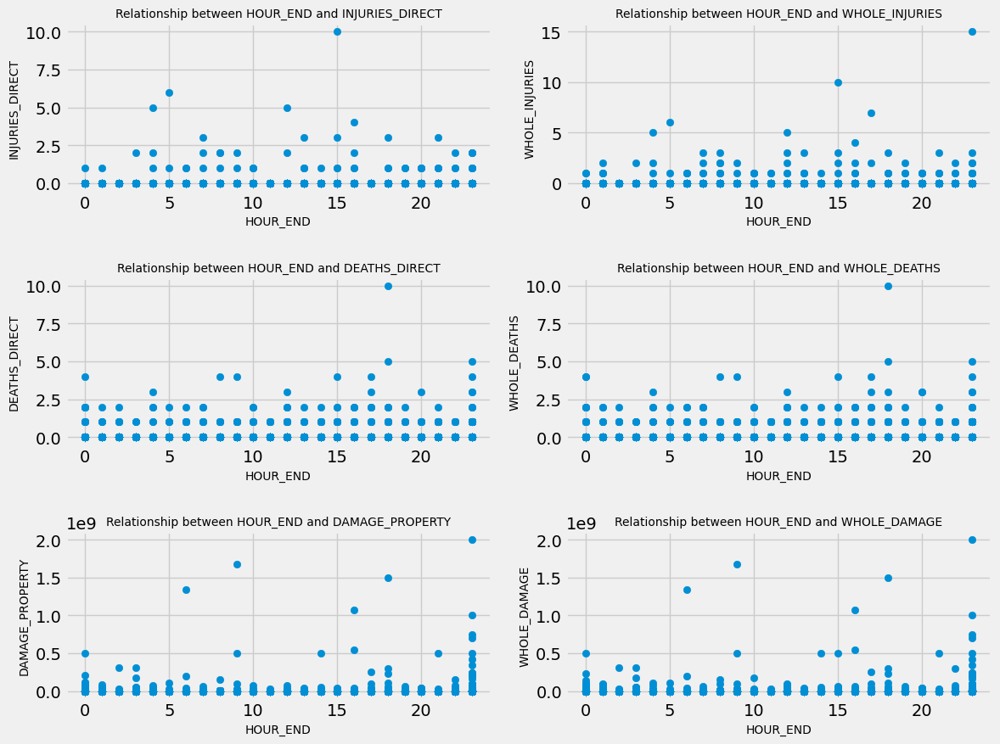

In [102]:
numscatterplot(num, var='HOUR_END', target=targets)

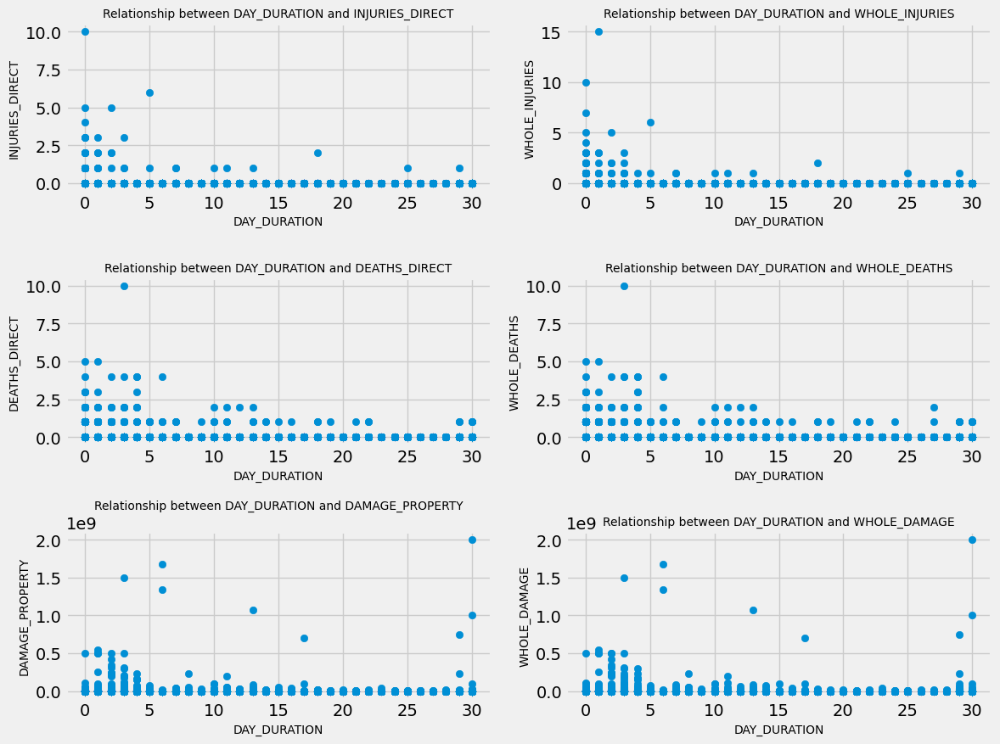

In [103]:
numscatterplot(num, var='DAY_DURATION', target=targets)

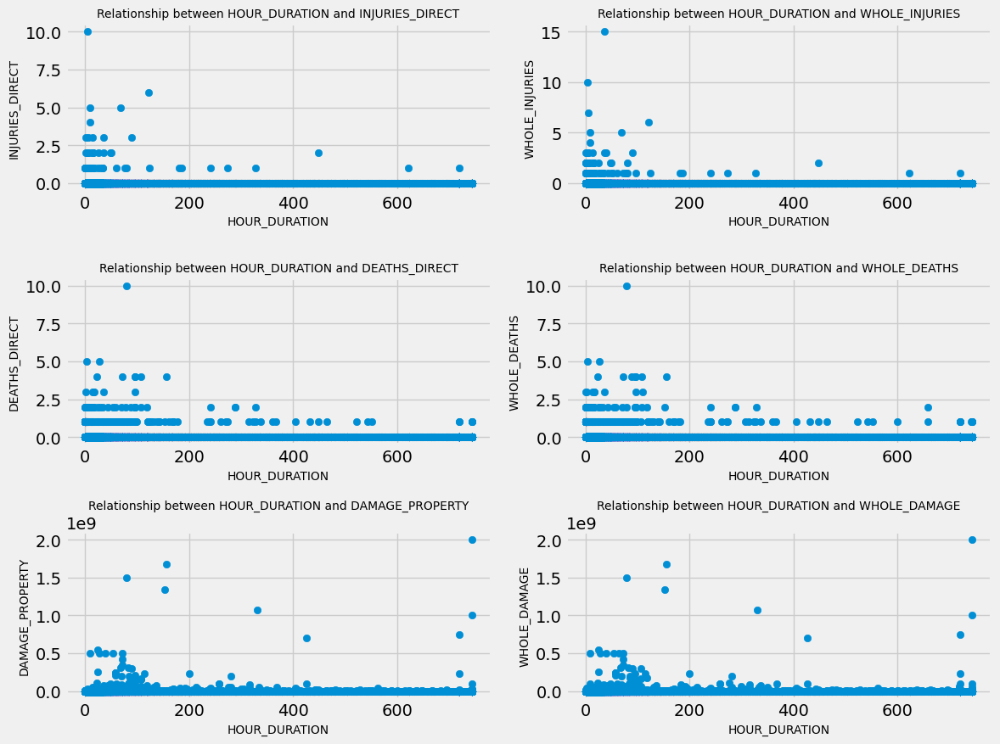

In [104]:
numscatterplot(num, var='HOUR_DURATION', target=targets)

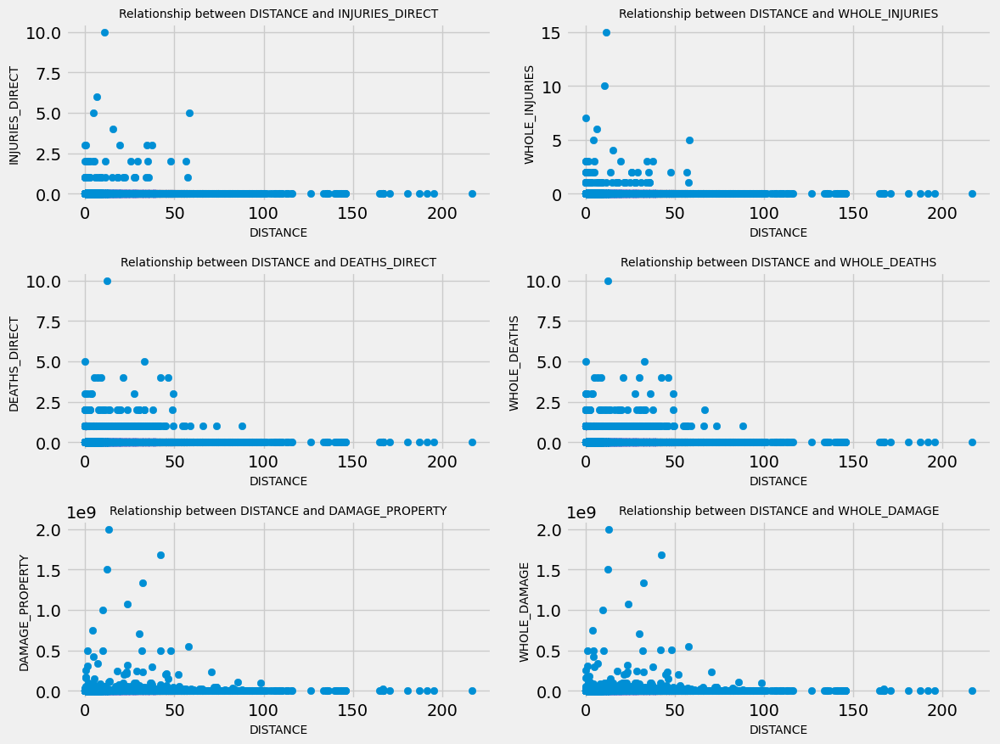

In [105]:
numscatterplot(num, var='DISTANCE', target=targets)

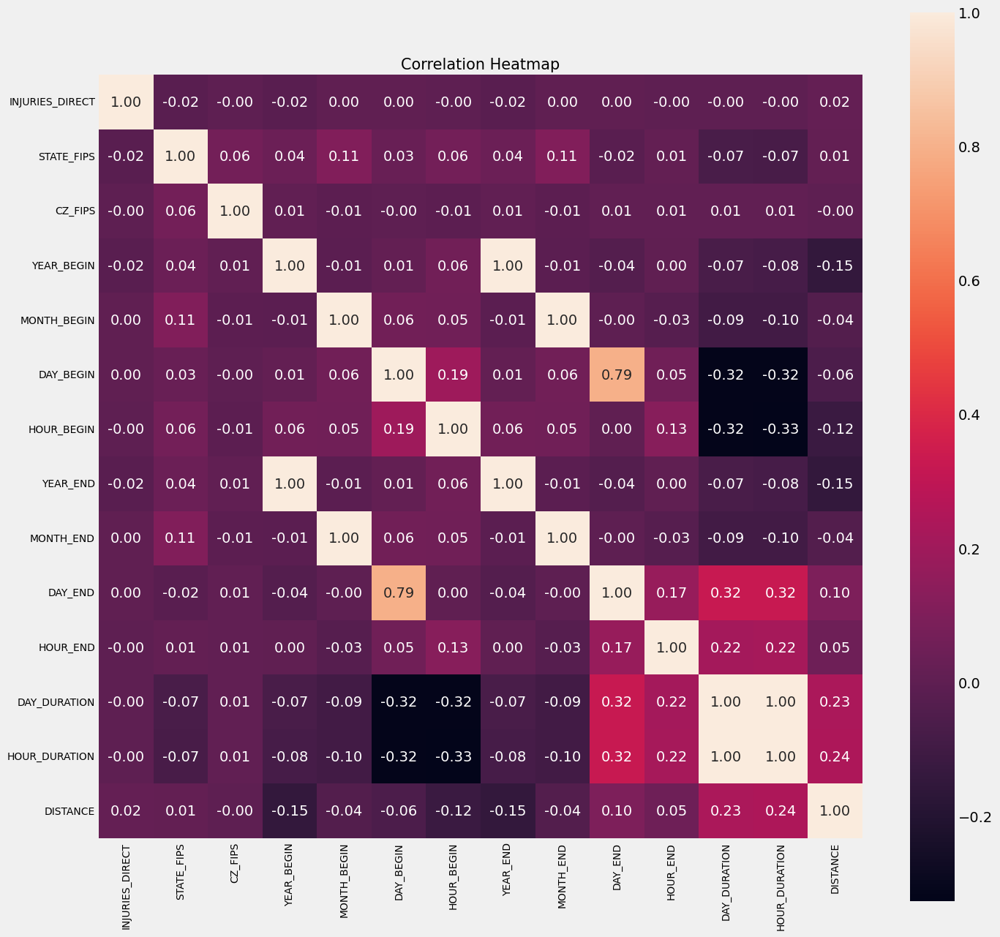

In [106]:
# Correlation heatmap
corr_matrix_id = num[['INJURIES_DIRECT','STATE_FIPS','CZ_FIPS','YEAR_BEGIN','MONTH_BEGIN',
                      'DAY_BEGIN','HOUR_BEGIN','YEAR_END','MONTH_END','DAY_END','HOUR_END',
                      'DAY_DURATION','HOUR_DURATION','DISTANCE']].corr()
numheatmap(corr_matrix_id)

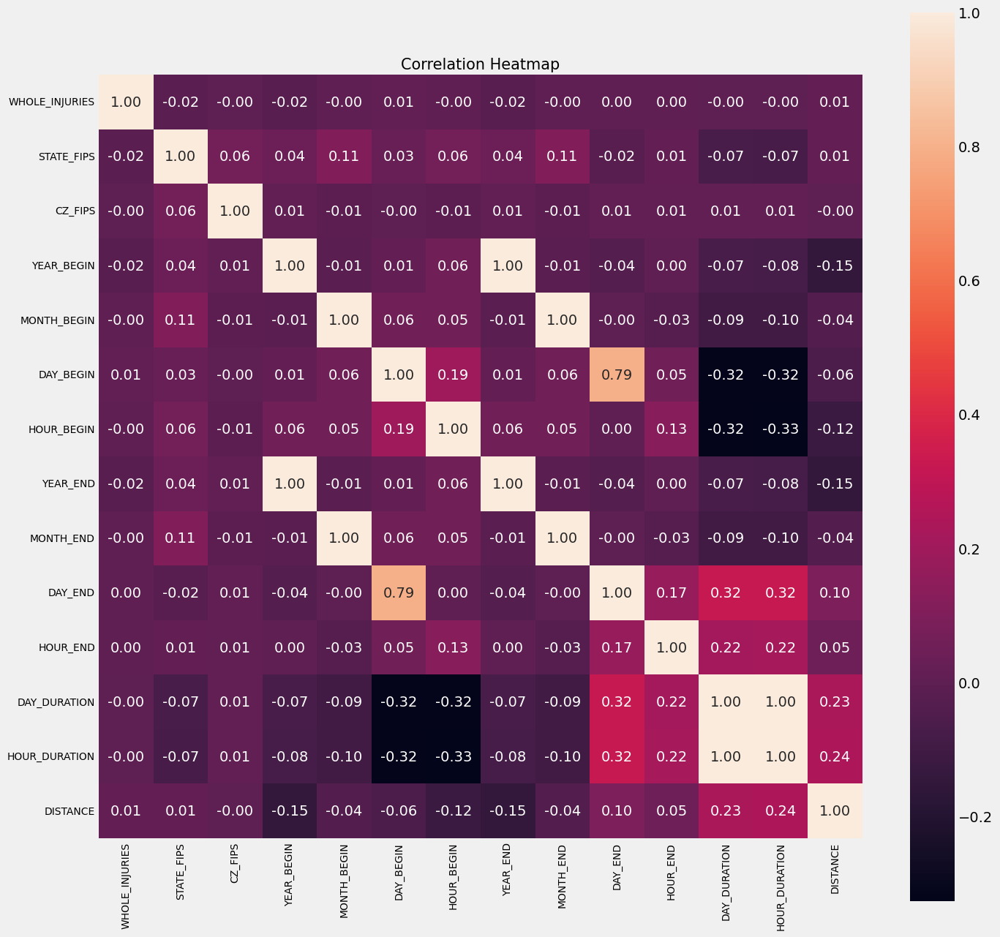

In [107]:
# Correlation heatmap
corr_matrix_wi = num[['WHOLE_INJURIES','STATE_FIPS','CZ_FIPS','YEAR_BEGIN','MONTH_BEGIN','DAY_BEGIN',
                  'HOUR_BEGIN','YEAR_END','MONTH_END','DAY_END','HOUR_END','DAY_DURATION',
                  'HOUR_DURATION','DISTANCE']].corr()
numheatmap(corr_matrix_wi)

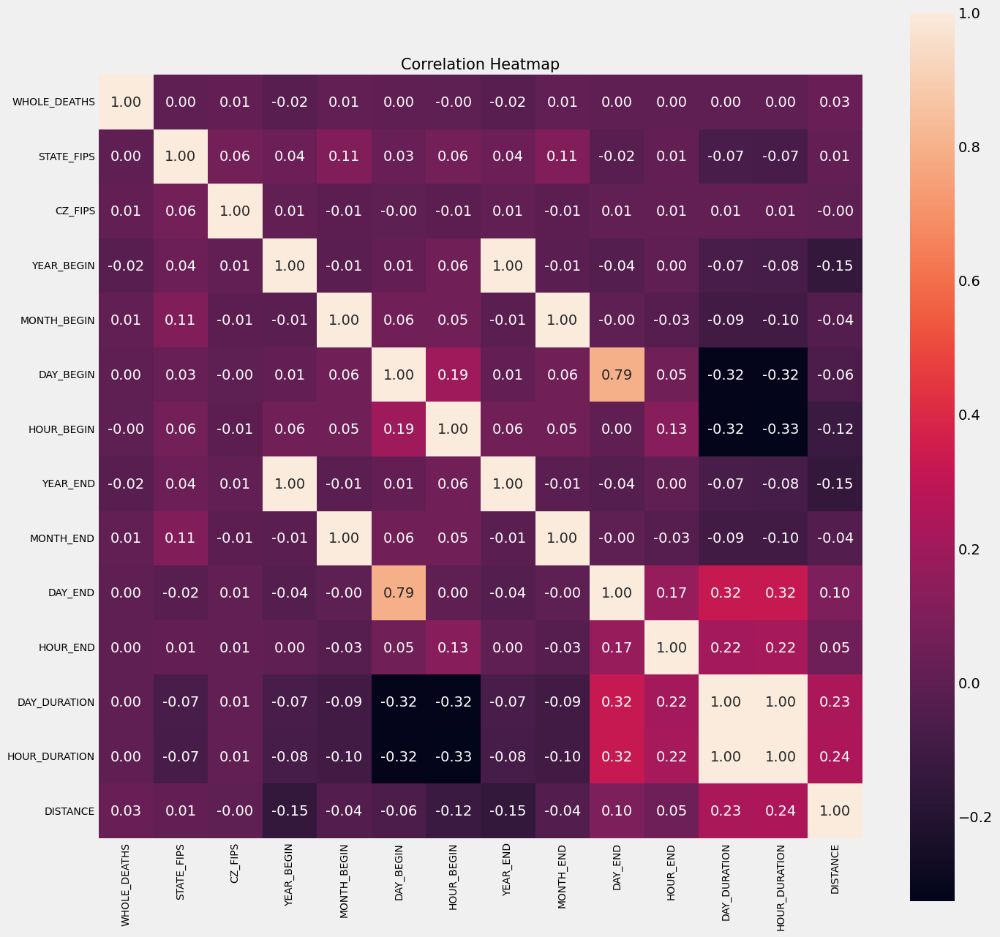

In [108]:
# Correlation heatmap
corr_matrix_wd = num[['WHOLE_DEATHS','STATE_FIPS','CZ_FIPS','YEAR_BEGIN','MONTH_BEGIN','DAY_BEGIN',
                  'HOUR_BEGIN','YEAR_END','MONTH_END','DAY_END','HOUR_END','DAY_DURATION',
                  'HOUR_DURATION','DISTANCE']].corr()
numheatmap(corr_matrix_wd)

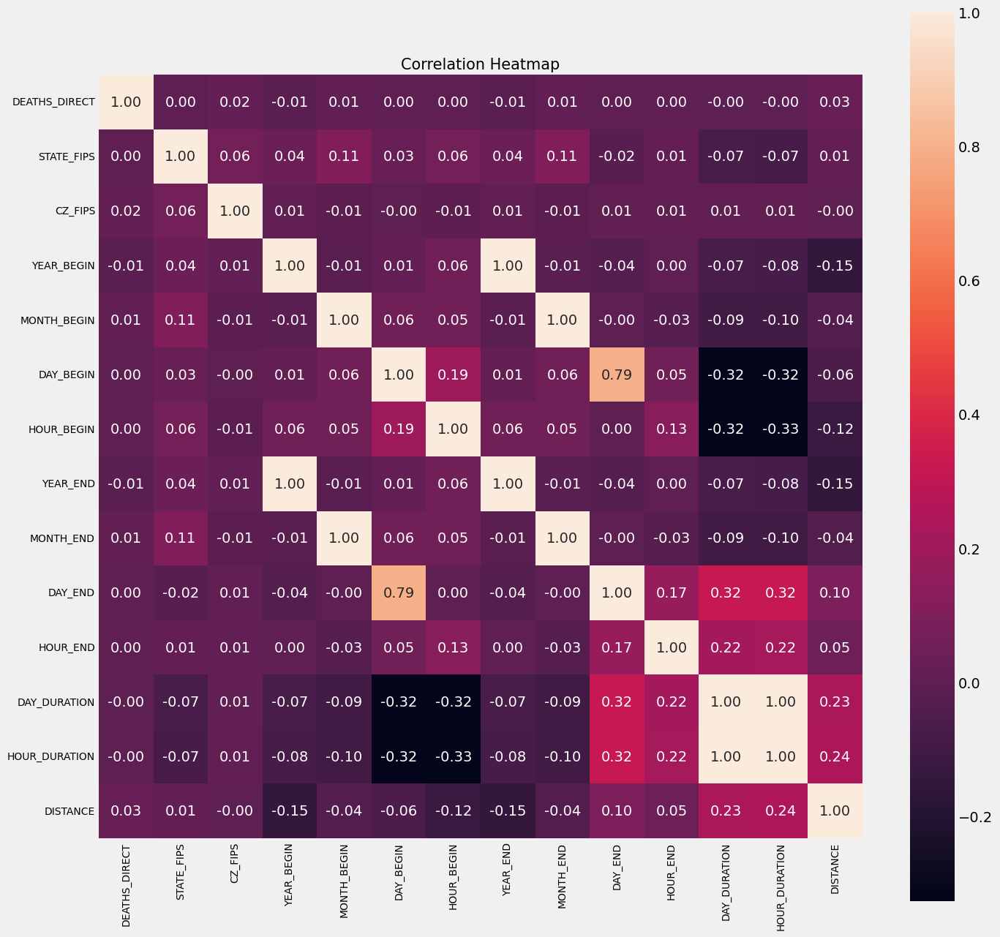

In [109]:
# Correlation heatmap
corr_matrix_dd = num[['DEATHS_DIRECT','STATE_FIPS','CZ_FIPS','YEAR_BEGIN','MONTH_BEGIN','DAY_BEGIN',
                  'HOUR_BEGIN','YEAR_END','MONTH_END','DAY_END','HOUR_END','DAY_DURATION',
                  'HOUR_DURATION','DISTANCE']].corr()
numheatmap(corr_matrix_dd)

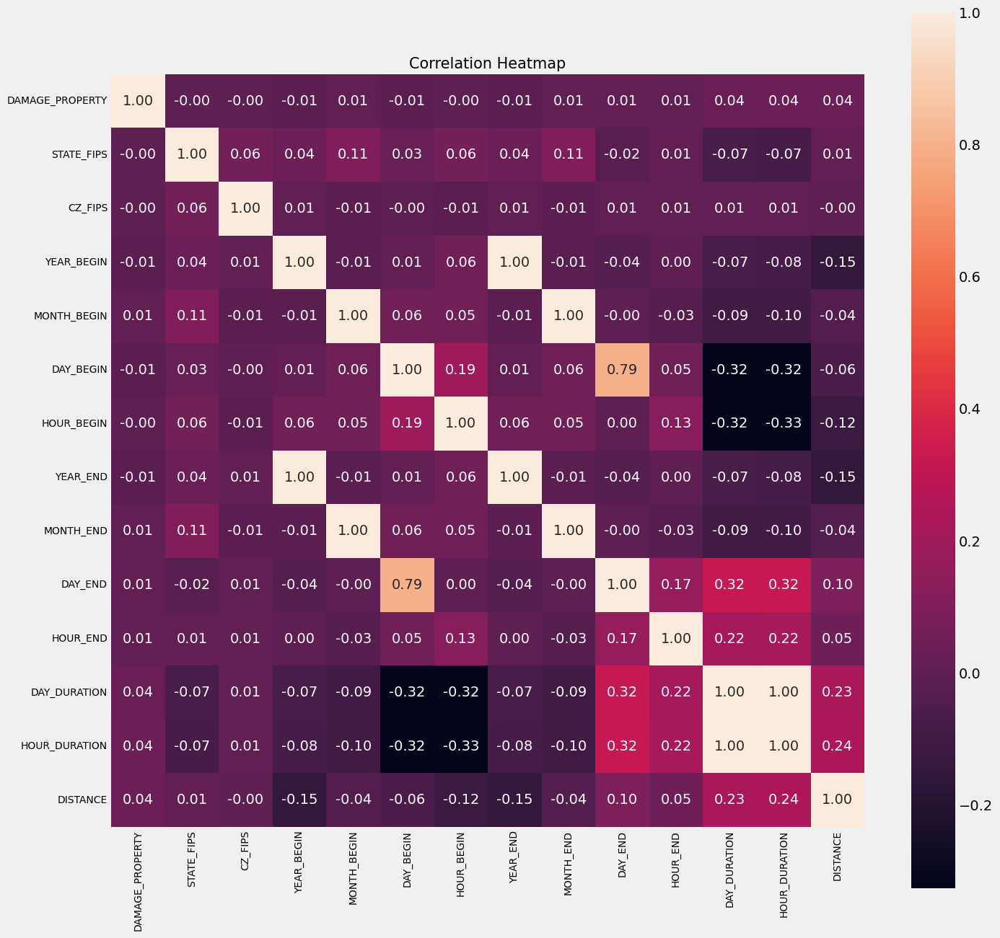

In [110]:
# Correlation heatmap
corr_matrix_dp = num[['DAMAGE_PROPERTY','STATE_FIPS','CZ_FIPS','YEAR_BEGIN','MONTH_BEGIN','DAY_BEGIN',
                  'HOUR_BEGIN','YEAR_END','MONTH_END','DAY_END','HOUR_END','DAY_DURATION',
                  'HOUR_DURATION','DISTANCE']].corr()
numheatmap(corr_matrix_dp)

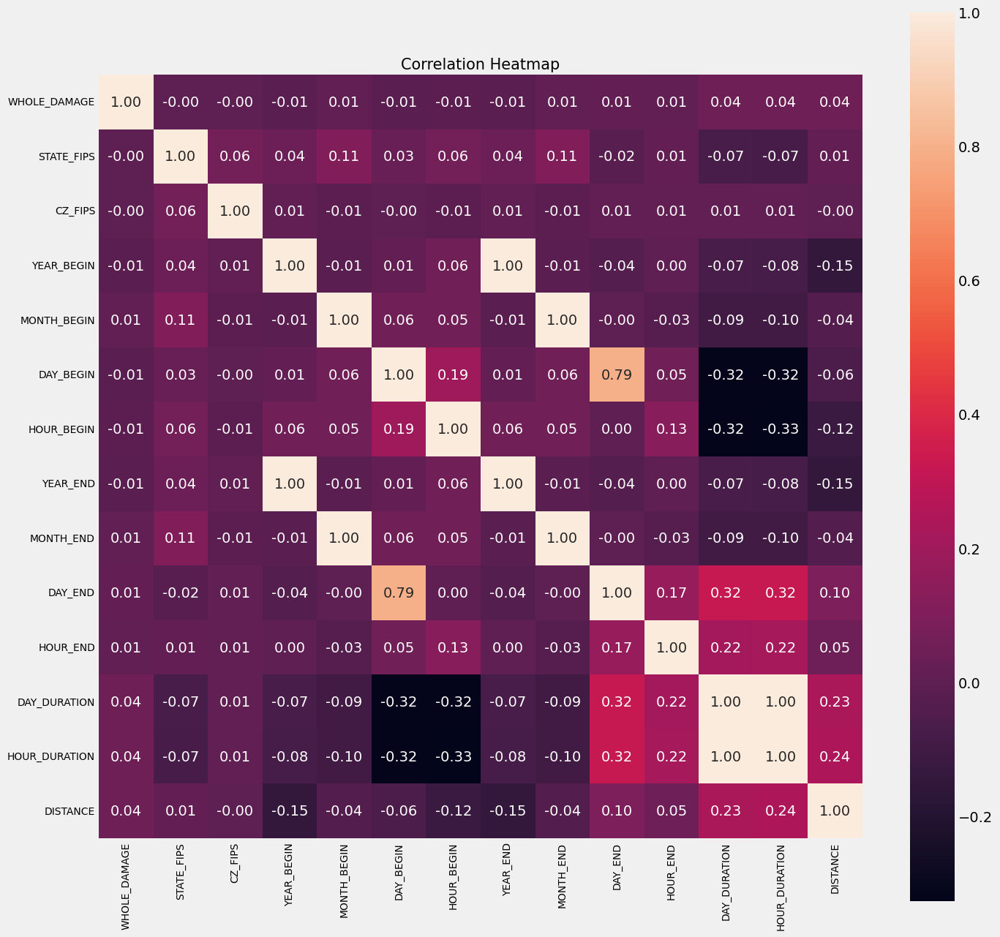

In [111]:
# Correlation heatmap
corr_matrix_wd = num[['WHOLE_DAMAGE','STATE_FIPS','CZ_FIPS','YEAR_BEGIN','MONTH_BEGIN','DAY_BEGIN',
                  'HOUR_BEGIN','YEAR_END','MONTH_END','DAY_END','HOUR_END','DAY_DURATION',
                  'HOUR_DURATION','DISTANCE']].corr()
numheatmap(corr_matrix_wd)

### Text Data Analysis & Embedding Features

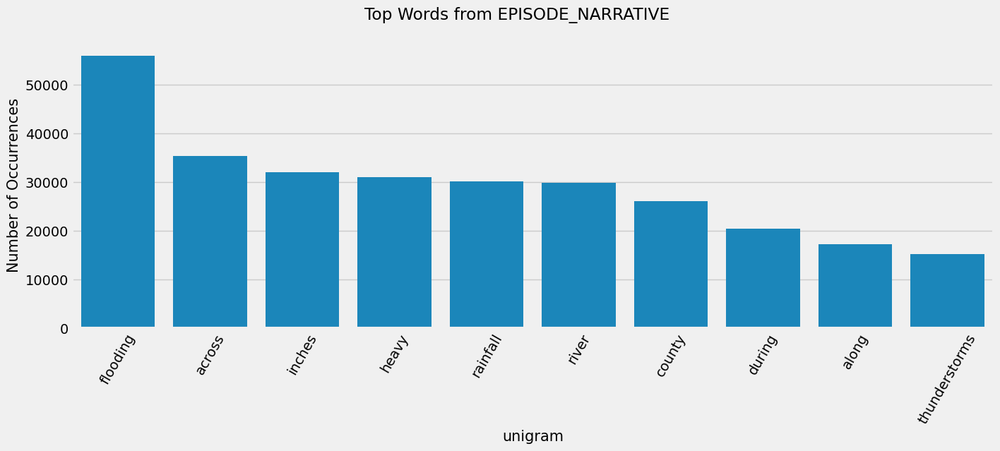

In [112]:
# Word vectorizer
common_words_episode_uni = get_top_n_words(df_2['EPISODE_NARRATIVE'], 10, 1)
df_uni_episode = pd.DataFrame(common_words_episode_uni, columns = ['unigram' , 'count'])
# Word Plot
word_plot(df=df_uni_episode, var='EPISODE_NARRATIVE', type='unigram')

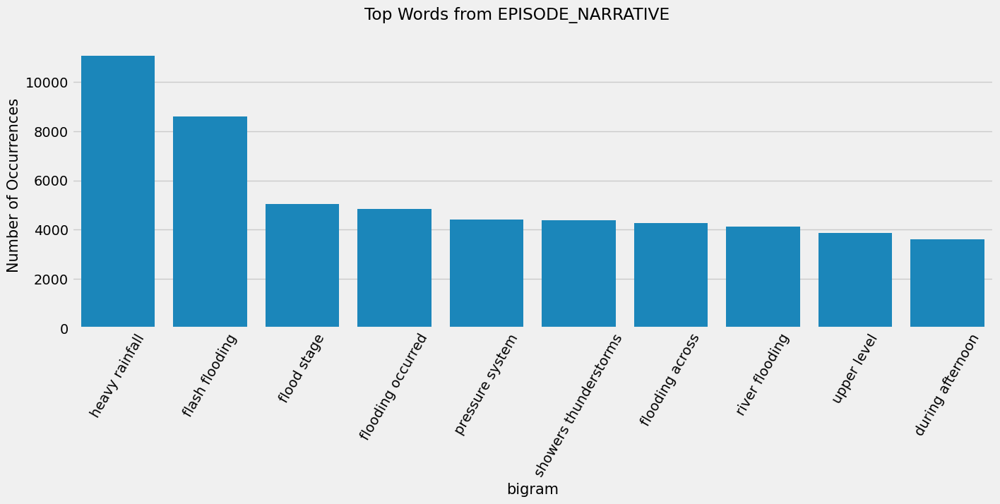

In [113]:
# Word vectorizer
common_words_episode_bi = get_top_n_words(df_2['EPISODE_NARRATIVE'], 10, 2)
df_bi_episode = pd.DataFrame(common_words_episode_bi, columns = ['bigram' , 'count'])
# Word Plot
word_plot(df=df_bi_episode, var='EPISODE_NARRATIVE', type='bigram')

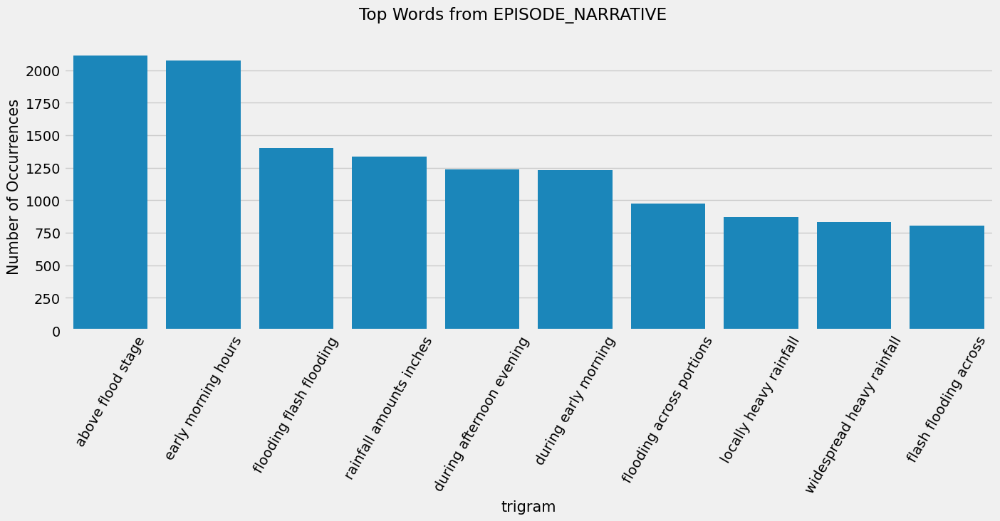

In [114]:
# Word vectorizer
common_words_episode_tri = get_top_n_words(df_2['EPISODE_NARRATIVE'], 10, 3)
df_tri_episode = pd.DataFrame(common_words_episode_tri, columns = ['trigram' , 'count'])
# Word Plot
word_plot(df=df_tri_episode, var='EPISODE_NARRATIVE', type='trigram')

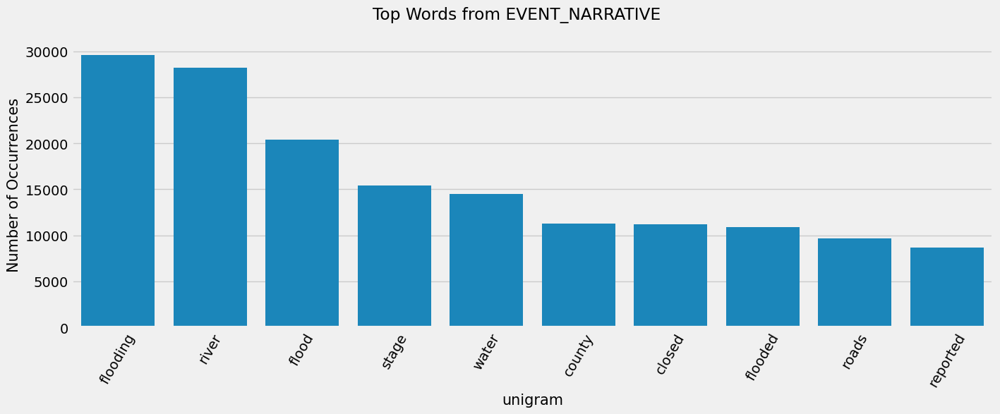

In [115]:
# Word vectorizer
common_words_event_uni = get_top_n_words(df_2['EVENT_NARRATIVE'], 10,1)
df_uni_event = pd.DataFrame(common_words_event_uni, columns = ['unigram' , 'count'])
# Word Plot
word_plot(df=df_uni_event, var='EVENT_NARRATIVE', type='unigram')

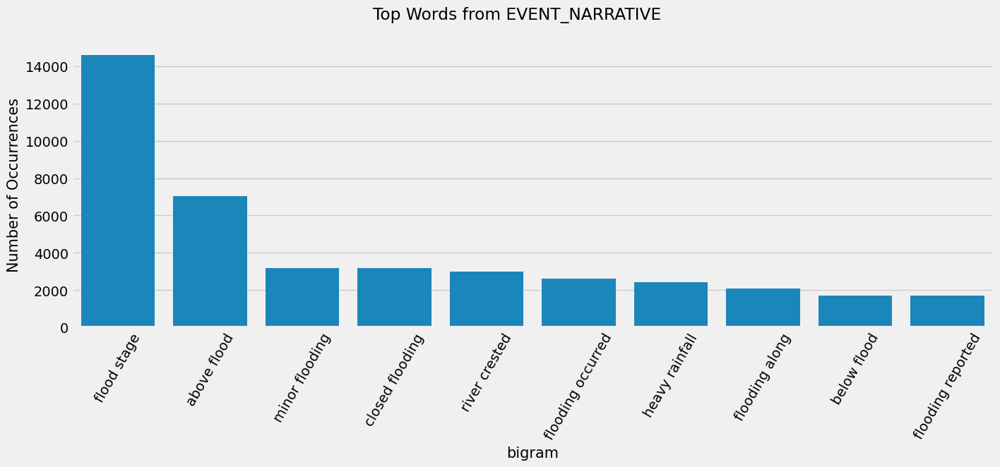

In [116]:
# Word vectorizer
common_words_event_bi = get_top_n_words(df_2['EVENT_NARRATIVE'], 10,2)
df_bi_event = pd.DataFrame(common_words_event_bi, columns = ['bigram' , 'count'])
# Word Plot
word_plot(df=df_bi_event, var='EVENT_NARRATIVE', type='bigram')

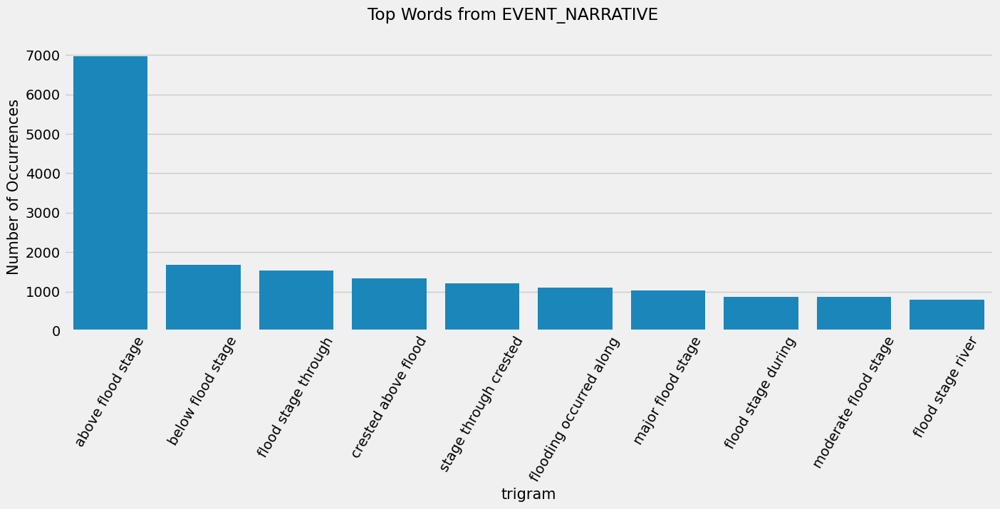

In [117]:
# Word vectorizer
common_words_event_tri = get_top_n_words(df_2['EVENT_NARRATIVE'], 10,3)
df_tri_event = pd.DataFrame(common_words_event_tri, columns = ['trigram' , 'count'])
# Word Plot
word_plot(df=df_tri_event, var='EVENT_NARRATIVE', type='trigram')

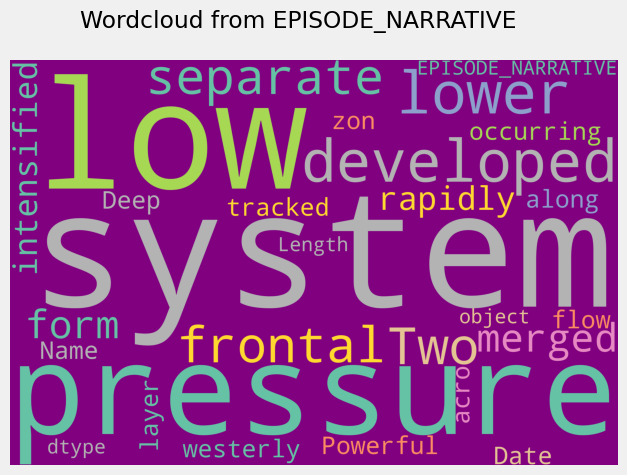

In [118]:
# Word Cloud
word_cloud(df=df_2, var='EPISODE_NARRATIVE')

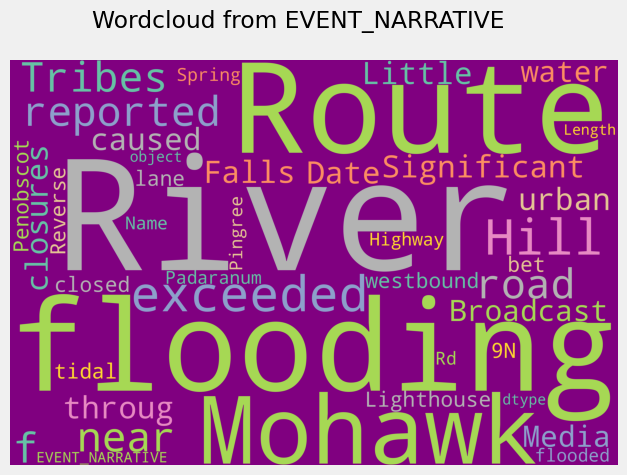

In [119]:
# Word Cloud
word_cloud(df=df_2, var='EVENT_NARRATIVE')

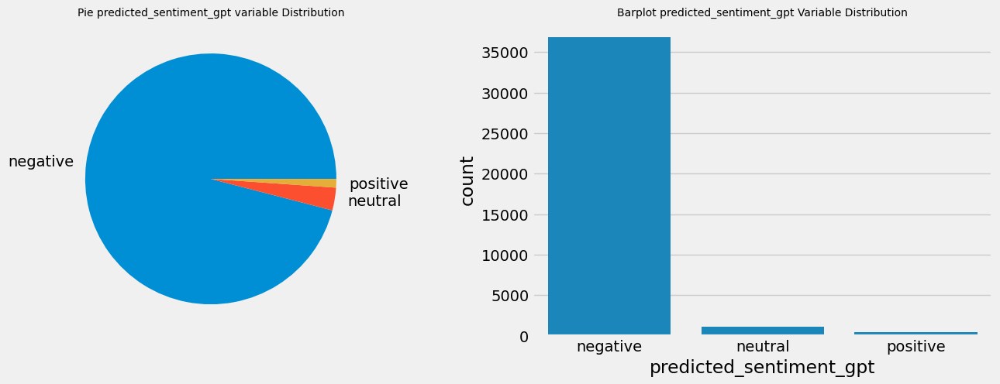

In [120]:
# Plot the sentiment variable
augmented_plot(df, var='predicted_sentiment_gpt')

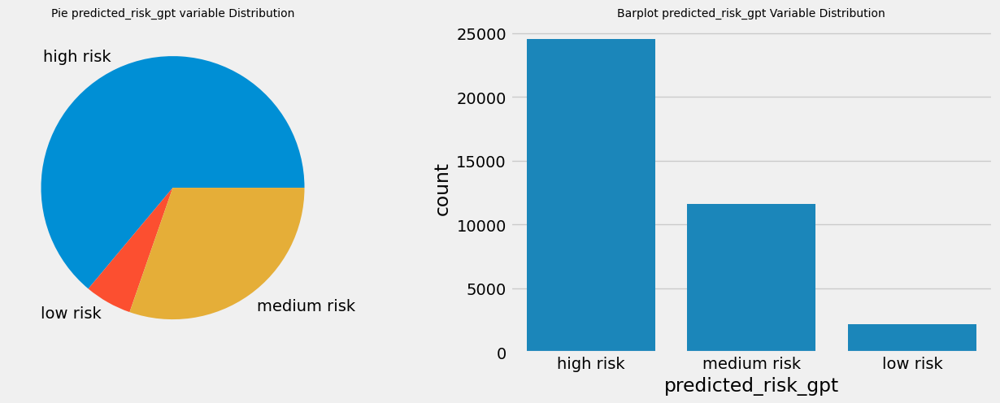

In [121]:
# Plot the risk variable
augmented_plot(df, var='predicted_risk_gpt')

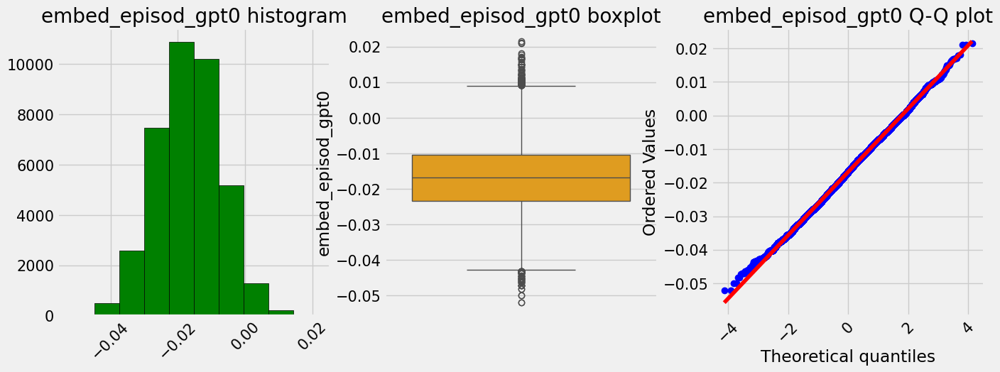

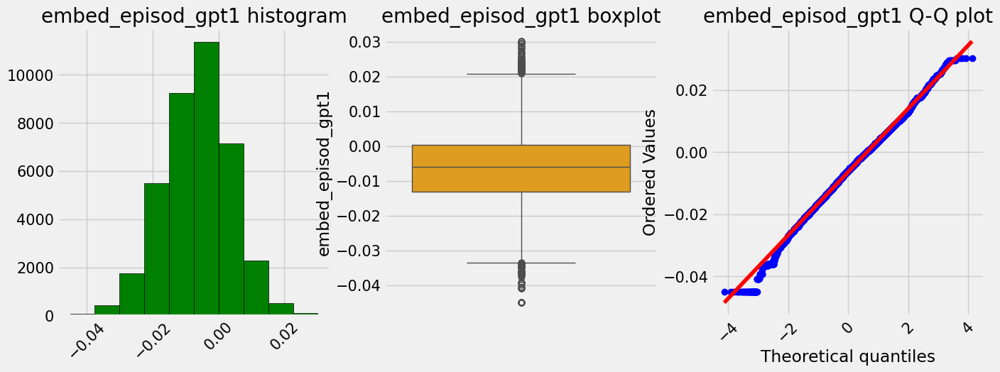

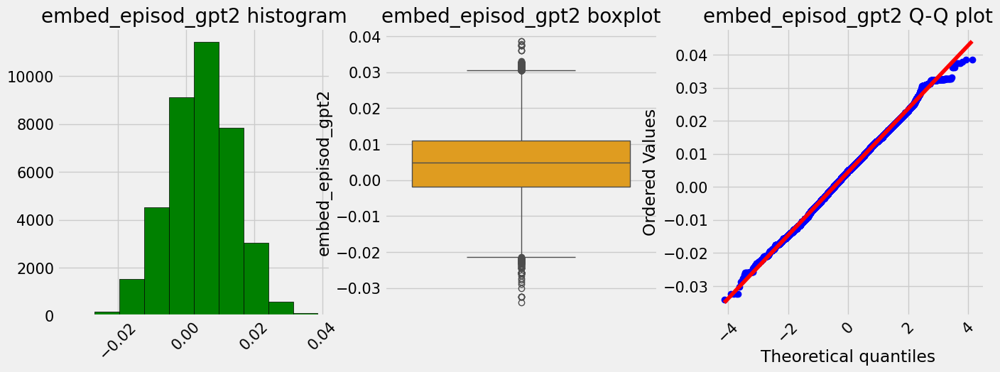

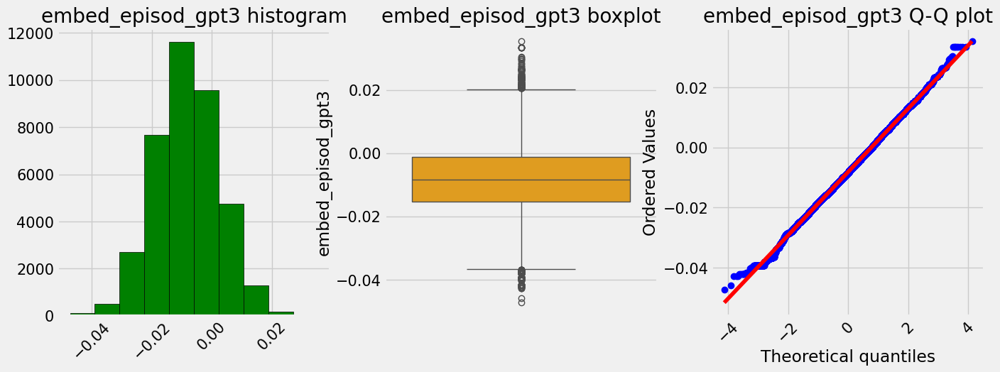

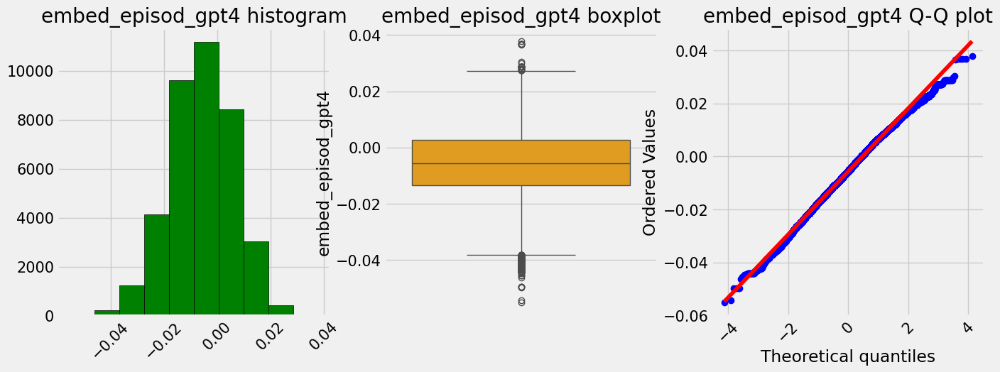

...

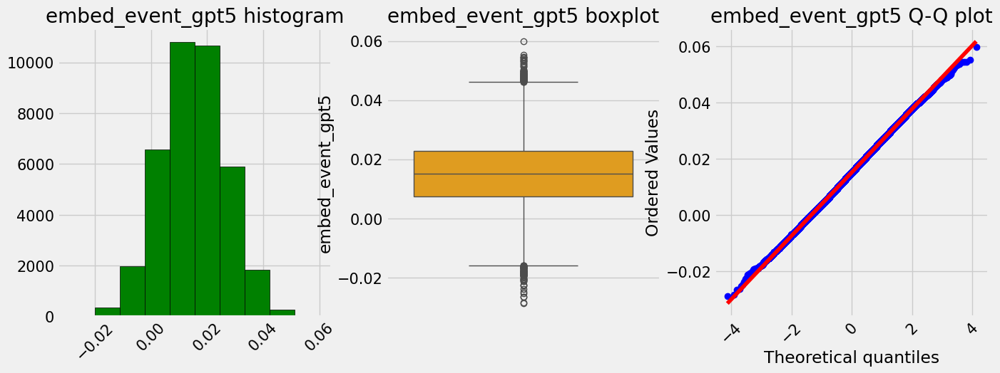

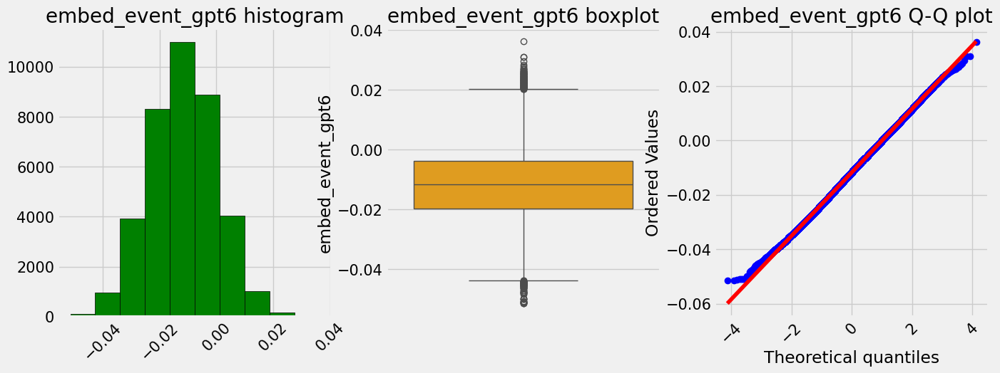

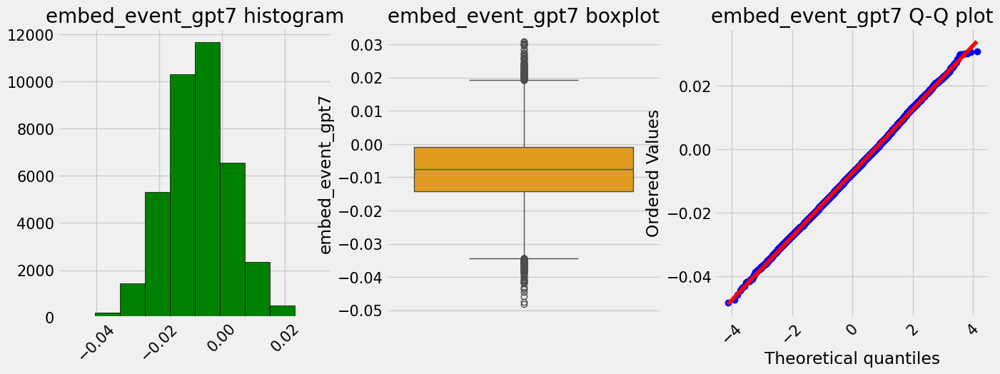

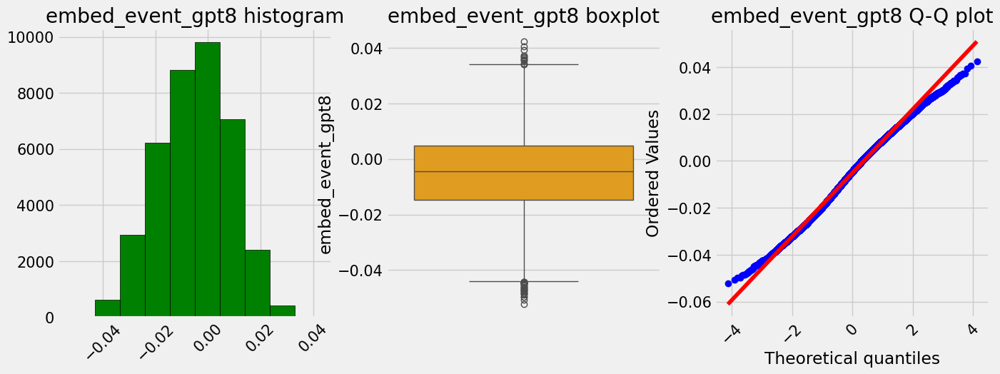

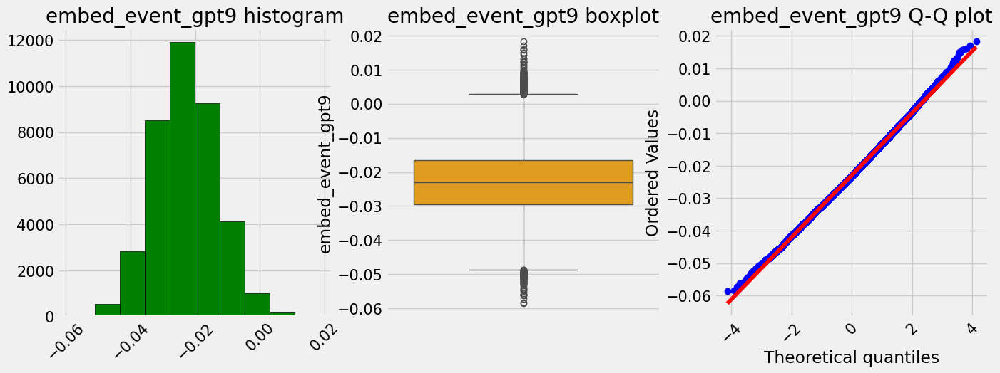

In [122]:
plot_num(num, var='embed_episod_gpt0')
plot_num(num, var='embed_episod_gpt1')
plot_num(num, var='embed_episod_gpt2')
plot_num(num, var='embed_episod_gpt3')
plot_num(num, var='embed_episod_gpt4')
plot_num(num, var='embed_episod_gpt5')
plot_num(num, var='embed_episod_gpt6')
plot_num(num, var='embed_episod_gpt7')
plot_num(num, var='embed_episod_gpt8')
plot_num(num, var='embed_episod_gpt9')
plot_num(num, var='embed_event_gpt0')
plot_num(num, var='embed_event_gpt1')
plot_num(num, var='embed_event_gpt2')
plot_num(num, var='embed_event_gpt3')
plot_num(num, var='embed_event_gpt4')
plot_num(num, var='embed_event_gpt5')
plot_num(num, var='embed_event_gpt6')
plot_num(num, var='embed_event_gpt7')
plot_num(num, var='embed_event_gpt8')
plot_num(num, var='embed_event_gpt9')
